# Imports

In [1]:
import pandas as pd
import numpy as np
import scipy as sp
import scipy.stats as sps
import matplotlib.pyplot as plt
from datetime import datetime

# Read the data

In [2]:
df1 = pd.read_csv('./../data/GPP_NEE_flux_2001-2022.csv')
df2 = pd.read_csv('./../data/voc_2010-2022.csv')
df3 = pd.read_csv('./../data/latent_heat_flux_2018-2022.csv')
df4 = pd.read_csv('./../data/latent_heat_flux_2001-2018.csv')
df5 = pd.read_csv('./../data/sensible_heat_flux_2001-2022.csv')

# Drop columnns 'Unnamed: 0'
df1 = df1.drop(columns=['Unnamed: 0'])
df2 = df2.drop(columns=['Unnamed: 0'])
df3 = df3.drop(columns=['Unnamed: 0'])
df4 = df4.drop(columns=['Unnamed: 0'])
df5 = df5.drop(columns=['Unnamed: 0'])

# Convert time labels to datetime objects
df1['Datetime'] = pd.to_datetime(df1['Datetime'])
df2['Datetime'] = pd.to_datetime(df2['Datetime'])
df3['Datetime'] = pd.to_datetime(df3['Datetime'])
df4['Datetime'] = pd.to_datetime(df4['Datetime'])
df5['Datetime'] = pd.to_datetime(df5['Datetime'])

# Config parameters

In [3]:
# 1) Select the aggregation method. Allowed values are 'mean' or 'median'
# agg_method = 'mean'
agg_method = 'median'
assert agg_method in ['mean', 'median']

# 2) Select the measurement hours to consider. Allowed values are 'all', 'noon'
# daily_hours = 'all'
daily_hours = 'noon'
assert daily_hours in ['all', 'noon']

In [4]:
if daily_hours=='noon':   
    # keep only observations occurring during 10.00-14.00 each day
    df1 = df1[(df1['Datetime'].dt.hour>=10) & (df1['Datetime'].dt.hour<=14)]
    df2 = df2[(df2['Datetime'].dt.hour>=10) & (df2['Datetime'].dt.hour<=14)]
    df3 = df3[(df3['Datetime'].dt.hour>=10) & (df3['Datetime'].dt.hour<=14)]
    df4 = df4[(df4['Datetime'].dt.hour>=10) & (df4['Datetime'].dt.hour<=14)]
    df5 = df5[(df5['Datetime'].dt.hour>=10) & (df5['Datetime'].dt.hour<=14)]

# Data exploration and visualization

## Raw data

### NEE flux

In [5]:
df1[30:50]
#df1.head(20)

,Datetime,NEE,NEE_gapfilling_method,GPP
164,2001-01-04 10:00:00,1.004,0,-0.523
165,2001-01-04 10:30:00,1.299,0,-0.820
166,2001-01-04 11:00:00,0.798,0,-0.320
167,2001-01-04 11:30:00,0.574,0,-0.095
168,2001-01-04 12:00:00,0.330,1,0.150
169,2001-01-04 12:30:00,0.356,1,0.124
170,2001-01-04 13:00:00,0.349,1,0.131
171,2001-01-04 13:30:00,0.351,1,0.130
172,2001-01-04 14:00:00,0.389,1,0.093
173,2001-01-04 14:30:00,0.428,1,0.055


In [6]:
# Keep only the rows where NEE_gapfilling_method is 0
df1 = df1[df1.NEE_gapfilling_method == 0]

# Reset the index
df1.reset_index(drop=True, inplace=True)

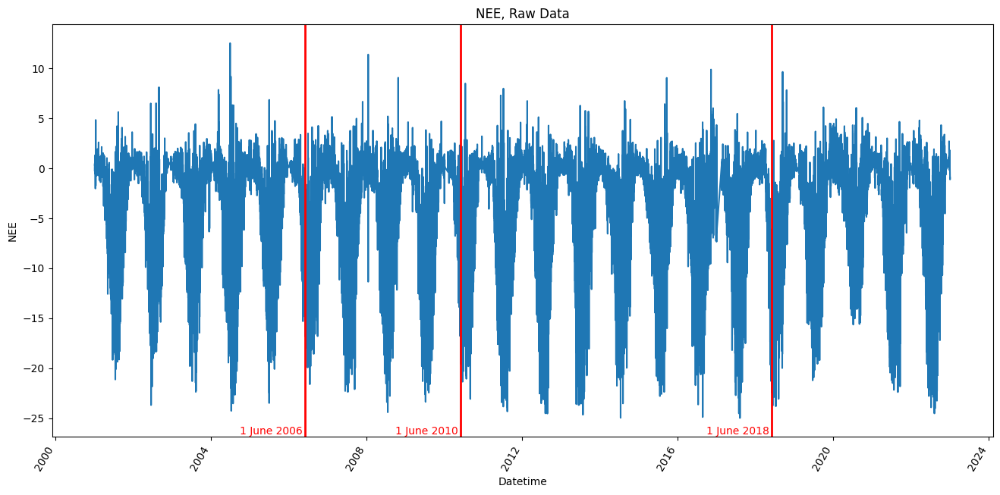

In [7]:
# Create the plot
fig, ax = plt.subplots(figsize=(16,8))
df1.plot('Datetime','NEE', ax=ax)

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('NEE')
ax.set_title('NEE, Raw Data')

# Don't show legend
ax.get_legend().remove()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

plt.show()

### VOC

In [8]:
df2.head(20)

,Datetime,monoterpene_flux,methanol_flux,acetone_flux,acetaldehyde_flux
6,2010-05-29 11:22:00,12.55916,16.89274,5.26526,2.14859
7,2010-05-29 14:22:00,8.66802,NaN,9.87562,3.15656
12,2010-05-30 11:22:00,46.20014,20.85436,1.72830,10.26371
13,2010-05-30 14:22:00,30.82751,47.23080,NaN,-2.41934
19,2010-05-31 11:22:00,NaN,14.98941,-2.58511,4.80365
20,2010-05-31 14:22:00,54.60981,43.83217,12.68789,1.01589
25,2010-06-01 11:22:00,44.32782,44.19043,17.50203,NaN
31,2010-06-11 11:22:00,56.01932,44.15847,21.81679,2.45634
32,2010-06-11 14:22:00,67.40488,49.15765,27.23689,13.00571
38,2010-06-12 11:22:00,82.21093,-50.95111,-2.15572,-1.67582


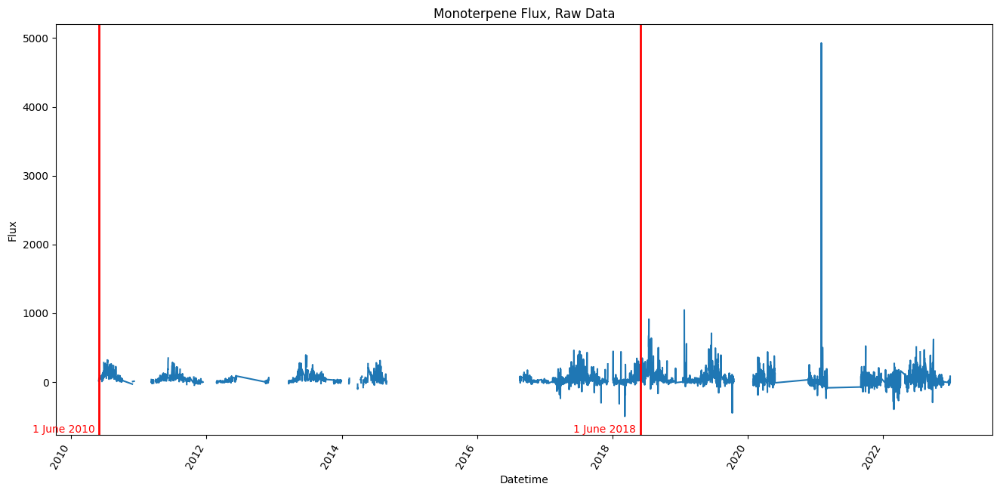

In [9]:
# Create the plot
fig, ax = plt.subplots(figsize=(16,8))
df2.plot('Datetime','monoterpene_flux', ax=ax)

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Monoterpene Flux, Raw Data')

# Don't show legend
ax.get_legend().remove()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
# ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
# ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

plt.show()

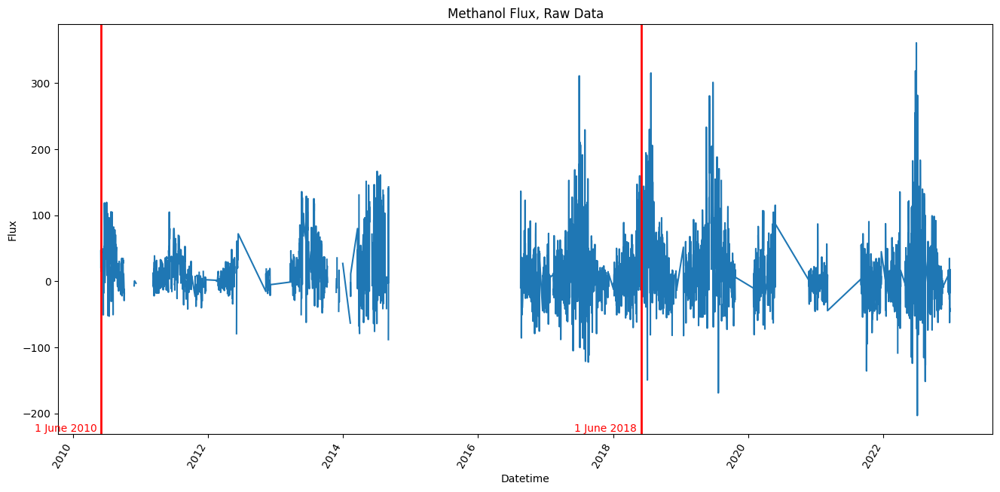

In [10]:
# Create the plot
fig, ax = plt.subplots(figsize=(16,8))
df2.plot('Datetime','methanol_flux', ax=ax)

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Methanol Flux, Raw Data')

# Don't show legend
ax.get_legend().remove()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
# ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
# ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

plt.show()


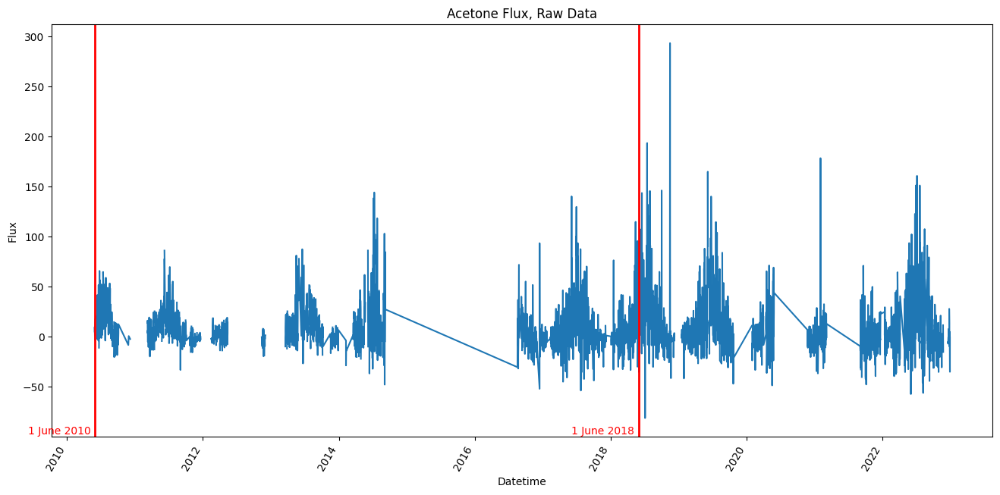

In [11]:
# Create the plot
fig, ax = plt.subplots(figsize=(16,8))
df2.plot('Datetime','acetone_flux', ax=ax)

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Acetone Flux, Raw Data')

# Don't show legend
ax.get_legend().remove()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
# ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
# ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

plt.show()

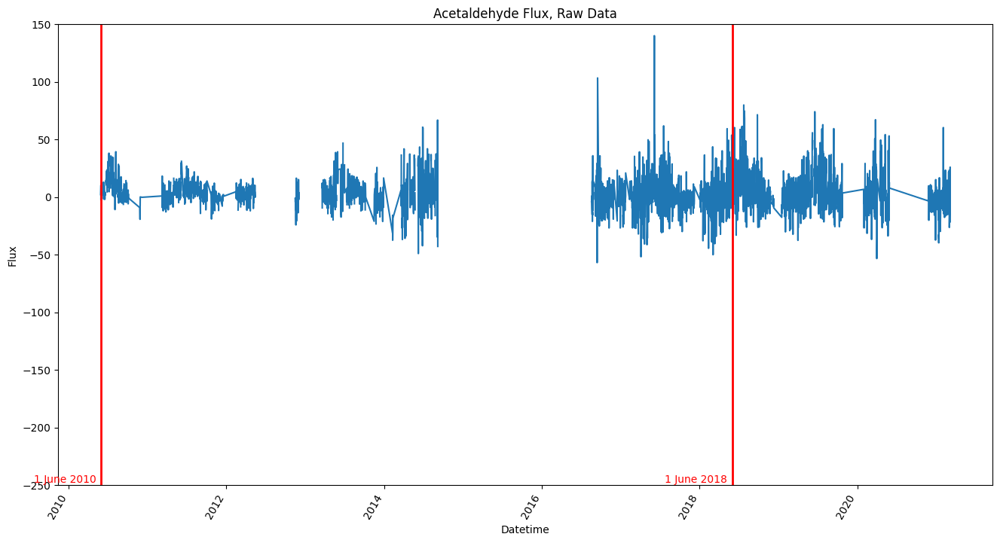

In [12]:
# Create the plot
fig, ax = plt.subplots(figsize=(16,9))
df2.plot('Datetime','acetaldehyde_flux', ax=ax)

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Acetaldehyde Flux, Raw Data')

# Don't show legend
ax.get_legend().remove()

# Set y-axis limits
ax.set_ylim(-250, 150)

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
# ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
# ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

plt.show()


### Latent heat flux

In [13]:
df4.head(20)

,Datetime,HYY_EDDY233.LE,HYY_EDDY233.Qc_LE
20,2001-01-01 10:00:00,1.14430,NaN
21,2001-01-01 10:30:00,2.43610,NaN
22,2001-01-01 11:00:00,3.80290,NaN
23,2001-01-01 11:30:00,1.70620,NaN
24,2001-01-01 12:00:00,0.69742,NaN
25,2001-01-01 12:30:00,1.54050,NaN
26,2001-01-01 13:00:00,1.30390,NaN
27,2001-01-01 13:30:00,-3.61410,NaN
28,2001-01-01 14:00:00,3.85810,NaN
29,2001-01-01 14:30:00,-0.15546,NaN


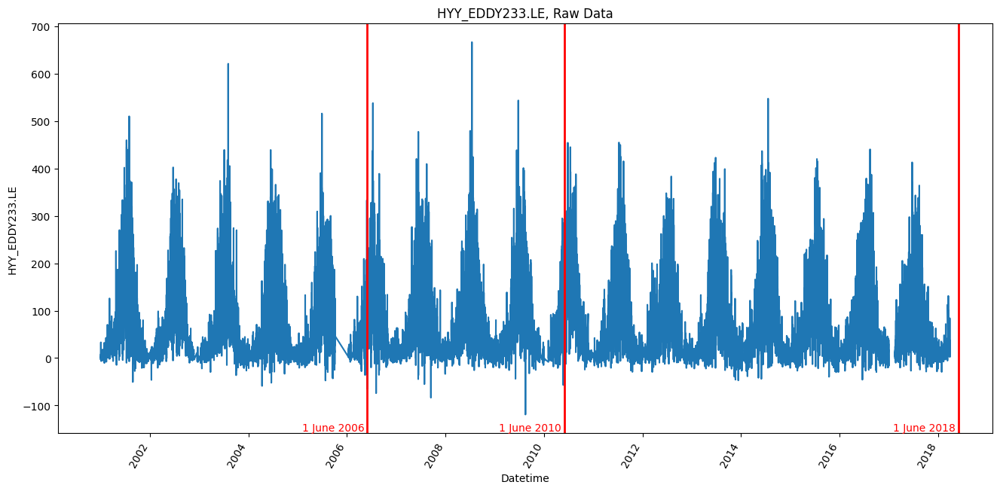

In [14]:
# Create the plot
fig, ax = plt.subplots(figsize=(16,8))
df4.plot('Datetime','HYY_EDDY233.LE', ax=ax)

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('HYY_EDDY233.LE')
ax.set_title('HYY_EDDY233.LE, Raw Data')

# Don't show legend
ax.get_legend().remove()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

plt.show()

In [15]:
df3.head(50)

,Datetime,latent_heat_flux_after_4-2018,latent_heat_flux_quality_flag_after_4-2018
18,2018-04-01 10:00:00,17.39900,0.0
19,2018-04-01 10:30:00,34.40690,1.0
20,2018-04-01 11:00:00,-2.60493,2.0
21,2018-04-01 11:30:00,40.78900,1.0
22,2018-04-01 12:00:00,-3.46411,2.0
23,2018-04-01 12:30:00,17.68370,1.0
24,2018-04-01 13:00:00,20.26940,0.0
25,2018-04-01 13:30:00,12.66600,0.0
26,2018-04-01 14:00:00,24.85700,2.0
27,2018-04-01 14:30:00,-1.91256,2.0


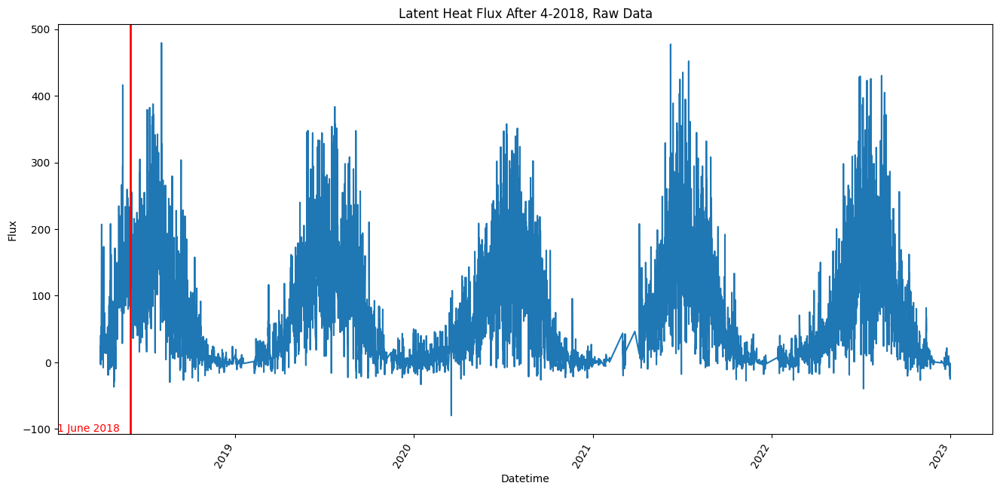

In [16]:
# Create the plot
fig, ax = plt.subplots(figsize=(16,8))
df3.plot('Datetime','latent_heat_flux_after_4-2018', ax=ax)

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Latent Heat Flux After 4-2018, Raw Data')

# Don't show legend
ax.get_legend().remove()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
# ax.axvline(datetime(2006,6,1), color='r', lw=2)
# ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
# ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
# ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

plt.show()

### Sensible heat flux

In [17]:
# Keep only the rows where NEE_gapfilling_method is 0
df5 = df5[df5.sensible_heat_flux_gapfilling_method == 0]

# Reset the index
df5.reset_index(drop=True, inplace=True)

df5.head(20)

,Datetime,sensible_heat_flux,sensible_heat_flux_gapfilling_method
0,2001-01-01 10:00:00,-8.295,0
1,2001-01-01 10:30:00,3.754,0
2,2001-01-01 11:00:00,36.793,0
3,2001-01-01 11:30:00,22.199,0
4,2001-01-01 12:00:00,25.023,0
5,2001-01-01 12:30:00,16.266,0
6,2001-01-01 13:00:00,4.293,0
7,2001-01-01 13:30:00,9.010,0
8,2001-01-01 14:00:00,-1.376,0
9,2001-01-01 14:30:00,8.765,0


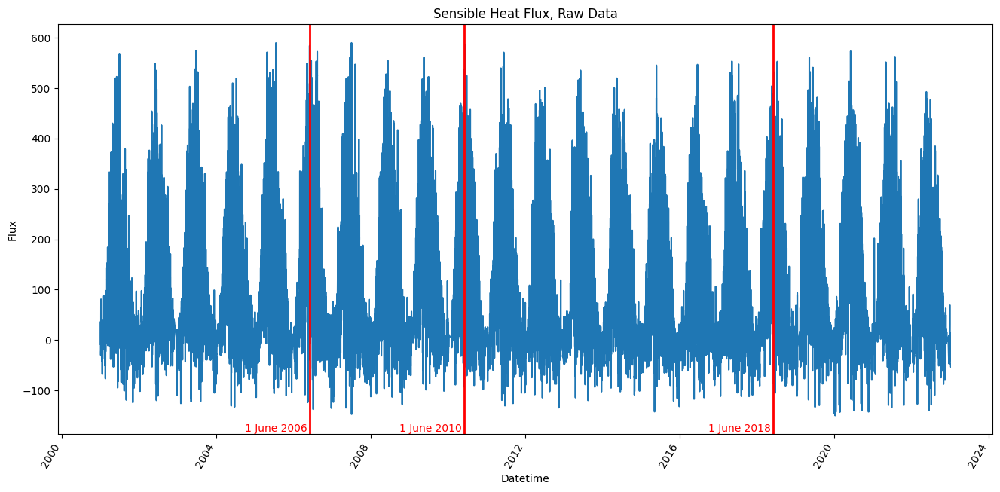

In [18]:
# Create the plot
fig, ax = plt.subplots(figsize=(16,8))
df5.plot('Datetime','sensible_heat_flux', ax=ax)

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Sensible Heat Flux, Raw Data')

# Don't show legend
ax.get_legend().remove()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

plt.show()

## Daily data

In [19]:
# Aggregate to daily level
if agg_method == 'mean':
    daily_df1 = df1.resample('D', on = 'Datetime').mean().reset_index()
    daily_df2 = df2.resample('D', on = 'Datetime').mean().reset_index()
    daily_df3 = df3.resample('D', on = 'Datetime').mean().reset_index()
    daily_df4 = df4.resample('D', on = 'Datetime').mean().reset_index()
    daily_df5 = df5.resample('D', on = 'Datetime').mean().reset_index()
elif agg_method == 'median':
    daily_df1 = df1.resample('D', on = 'Datetime').median().reset_index()
    daily_df2 = df2.resample('D', on = 'Datetime').median().reset_index()
    daily_df3 = df3.resample('D', on = 'Datetime').median().reset_index()
    daily_df4 = df4.resample('D', on = 'Datetime').median().reset_index()
    daily_df5 = df5.resample('D', on = 'Datetime').median().reset_index()
else:
    raise ValueError('agg_method must be either "mean" or "median"')

### NEE flux

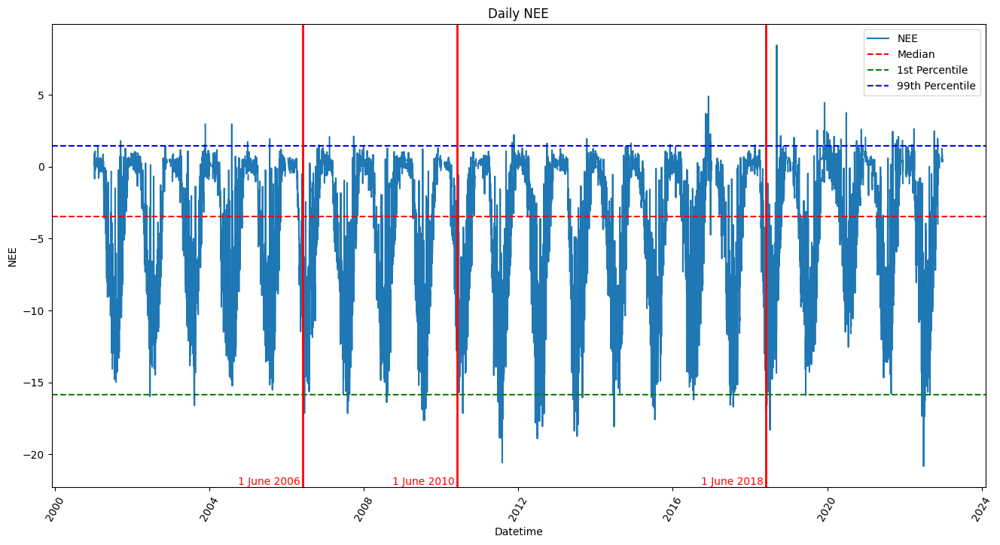

In [20]:
# Calculate median and the percentiles
median = daily_df1['NEE'].median()
q01 = daily_df1['NEE'].quantile(0.01)
q99 = daily_df1['NEE'].quantile(0.99)

# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the lines
ax.plot(daily_df1['Datetime'], daily_df1['NEE'], label='NEE')
ax.axhline(y=median, color='r', linestyle='--', label='Median')
ax.axhline(y=q01, color='g', linestyle='--', label='1st Percentile')
ax.axhline(y=q99, color='b', linestyle='--', label='99th Percentile')

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('NEE')
ax.set_title('Daily NEE')
ax.legend()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

# plt.tight_layout()
plt.show()

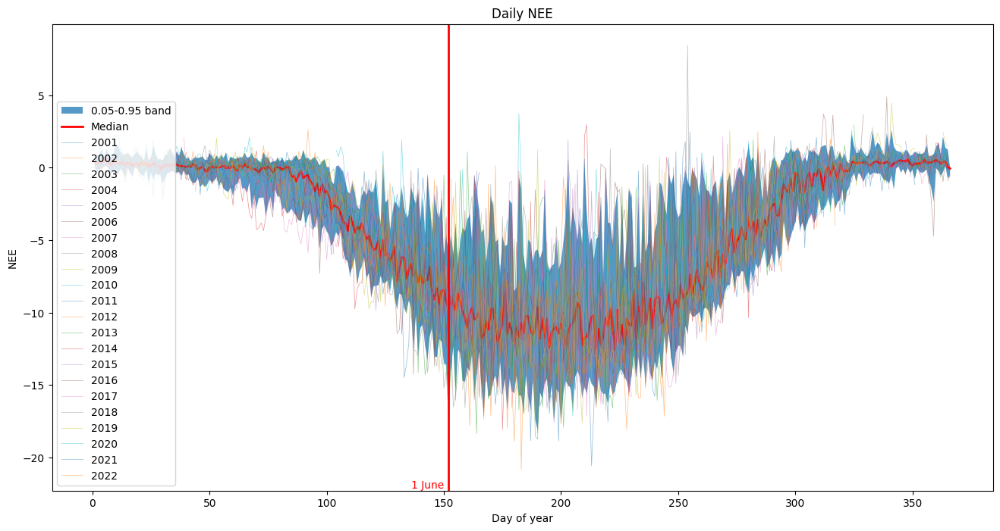

In [21]:
# Create a copy of the dataframe to avoid modifying the original
daily_df1_years = daily_df1.copy()

# Add a column for the day of year
daily_df1_years['day'] = daily_df1_years['Datetime'].dt.dayofyear

# Add a column for the year
daily_df1_years['year'] = daily_df1_years['Datetime'].dt.year

# Drop the column 'Datetime'
daily_df1_years = daily_df1_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are weeks and columns are years
daily_df1_years = daily_df1_years.pivot(index='day', columns='year', values='NEE')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(daily_df1_years.index, daily_df1_years.quantile(0.05, axis=1), daily_df1_years.quantile(0.95, axis=1), alpha=0.75)

# Plot the median
daily_df1_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individiual years
daily_df1_years.plot(ax=ax, alpha=0.5, linewidth=0.5)

# Add labels, title, and legend
ax.set_xlabel('Day of year')
ax.set_ylabel('NEE')
ax.set_title('Daily NEE')
# ax.legend(['Median'] + daily_df1_years.columns.tolist(), loc='lower left')
ax.legend(['0.05-0.95 band', 'Median'] + daily_df1_years.columns.tolist(), loc='lower left')


# Highlight the period of interest
ax.axvline(152, color='r', lw=2)

# Add labels to the lines
ax.text(150, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# plt.tight_layout()
plt.show()

### VOC

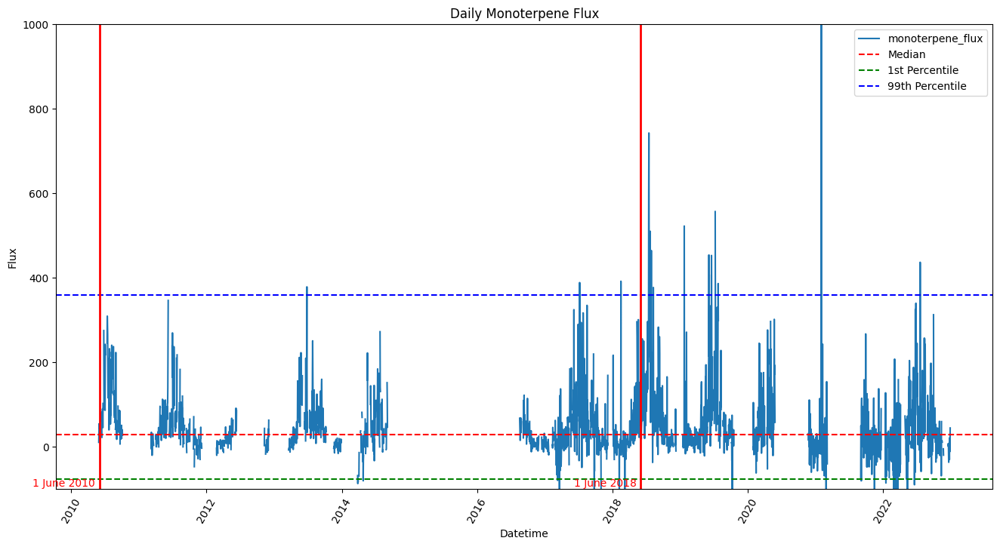

In [22]:
# Calculate median and the percentiles
median = daily_df2['monoterpene_flux'].median()
q01 = daily_df2['monoterpene_flux'].quantile(0.01)
q99 = daily_df2['monoterpene_flux'].quantile(0.99)

# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the lines
ax.plot(daily_df2['Datetime'], daily_df2['monoterpene_flux'], label='monoterpene_flux')
ax.axhline(y=median, color='r', linestyle='--', label='Median')
ax.axhline(y=q01, color='g', linestyle='--', label='1st Percentile')
ax.axhline(y=q99, color='b', linestyle='--', label='99th Percentile')

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Daily Monoterpene Flux')
ax.legend()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Set y-axis limits
ax.set_ylim(-100, 1000)

# Highlight the periods of interest
# ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
# ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

# plt.tight_layout()
plt.show()


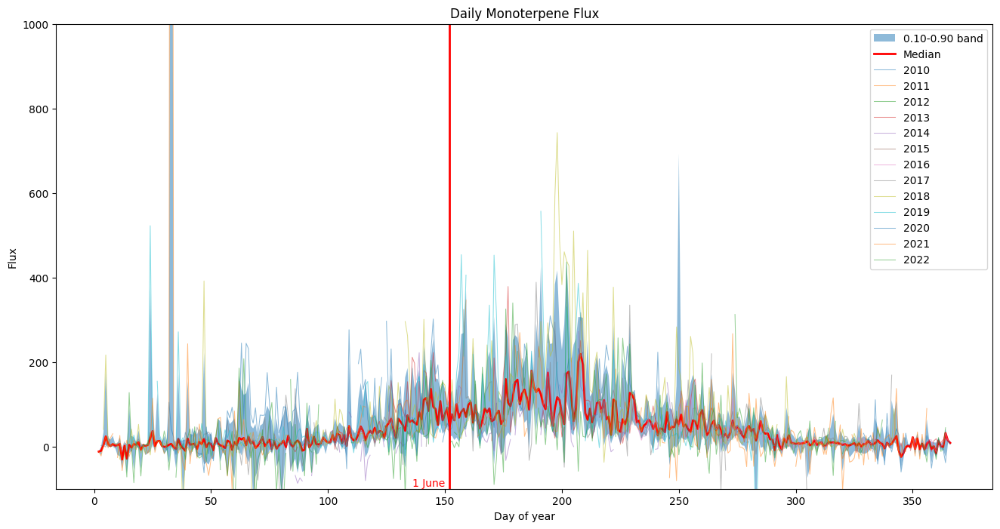

In [23]:
# Create a copy of the dataframe to avoid modifying the original
daily_df5_years = daily_df2.copy()

# Add a column for the day of year
daily_df5_years['day'] = daily_df5_years['Datetime'].dt.dayofyear

# Add a column for the year
daily_df5_years['year'] = daily_df5_years['Datetime'].dt.year

# Drop the column 'Datetime'
daily_df5_years = daily_df5_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are weeks and columns are years
daily_df5_years = daily_df5_years.pivot(index='day', columns='year', values='monoterpene_flux')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(daily_df5_years.index, daily_df5_years.quantile(0.10, axis=1), daily_df5_years.quantile(0.90, axis=1), alpha=0.5)

# Plot the median
daily_df5_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individual years
daily_df5_years.plot(ax=ax, alpha=0.5, linewidth=0.75)

# Add labels, title, and legend
ax.set_xlabel('Day of year')
ax.set_ylabel('Flux')
ax.set_title('Daily Monoterpene Flux')
# ax.legend(['Median'] + daily_df2_years.columns.tolist(), loc='upper right')
ax.legend(['0.10-0.90 band', 'Median'] + daily_df5_years.columns.tolist(), loc='upper right')

# Set y-axis limits
ax.set_ylim(-100, 1000)

# Highlight the period of interest
ax.axvline(152, color='r', lw=2)

# Add labels to the lines
ax.text(150, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# plt.tight_layout()
plt.show()

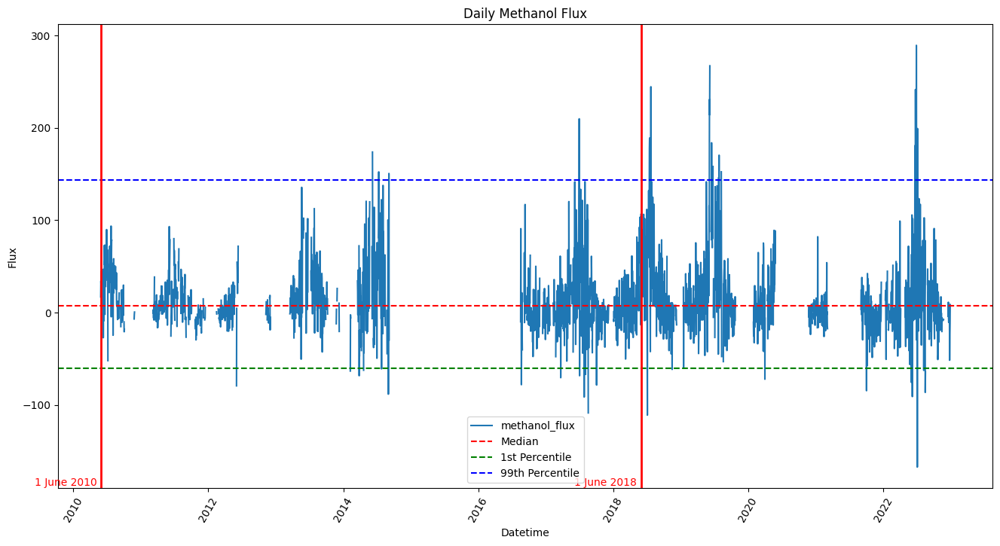

In [24]:
# Calculate median and the percentiles
median = daily_df2['methanol_flux'].median()
q01 = daily_df2['methanol_flux'].quantile(0.01)
q99 = daily_df2['methanol_flux'].quantile(0.99)

# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the lines
ax.plot(daily_df2['Datetime'], daily_df2['methanol_flux'], label='methanol_flux')
ax.axhline(y=median, color='r', linestyle='--', label='Median')
ax.axhline(y=q01, color='g', linestyle='--', label='1st Percentile')
ax.axhline(y=q99, color='b', linestyle='--', label='99th Percentile')

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Daily Methanol Flux')
ax.legend()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
# ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
# ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

# plt.tight_layout()
plt.show()


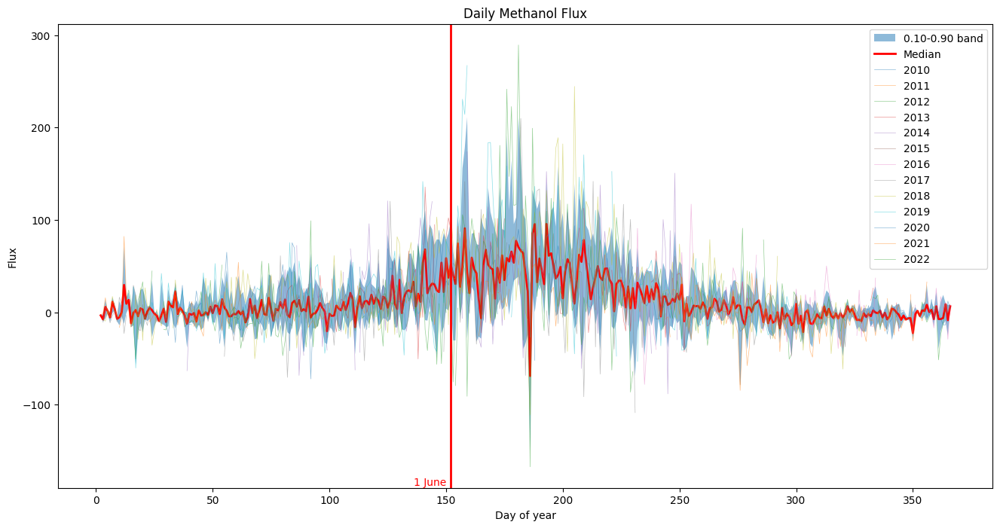

In [25]:
# Create a copy of the dataframe to avoid modifying the original
daily_df5_years = daily_df2.copy()

# Add a column for the day of year
daily_df5_years['day'] = daily_df5_years['Datetime'].dt.dayofyear

# Add a column for the year
daily_df5_years['year'] = daily_df5_years['Datetime'].dt.year

# Drop the column 'Datetime'
daily_df5_years = daily_df5_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are weeks and columns are years
daily_df5_years = daily_df5_years.pivot(index='day', columns='year', values='methanol_flux')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(daily_df5_years.index, daily_df5_years.quantile(0.1, axis=1), daily_df5_years.quantile(0.9, axis=1), alpha=0.5)

# Plot the median
daily_df5_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individual years
daily_df5_years.plot(ax=ax, alpha=0.5, linewidth=0.5)

# Add labels, title, and legend
ax.set_xlabel('Day of year')
ax.set_ylabel('Flux')
ax.set_title('Daily Methanol Flux')
ax.legend(['Median'] + daily_df5_years.columns.tolist(), loc='upper right')
ax.legend(['0.10-0.90 band', 'Median'] + daily_df5_years.columns.tolist(), loc='upper right')

# Highlight the period of interest
ax.axvline(152, color='r', lw=2)

# Add labels to the lines
ax.text(150, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-75, 175)

# plt.tight_layout()
plt.show()

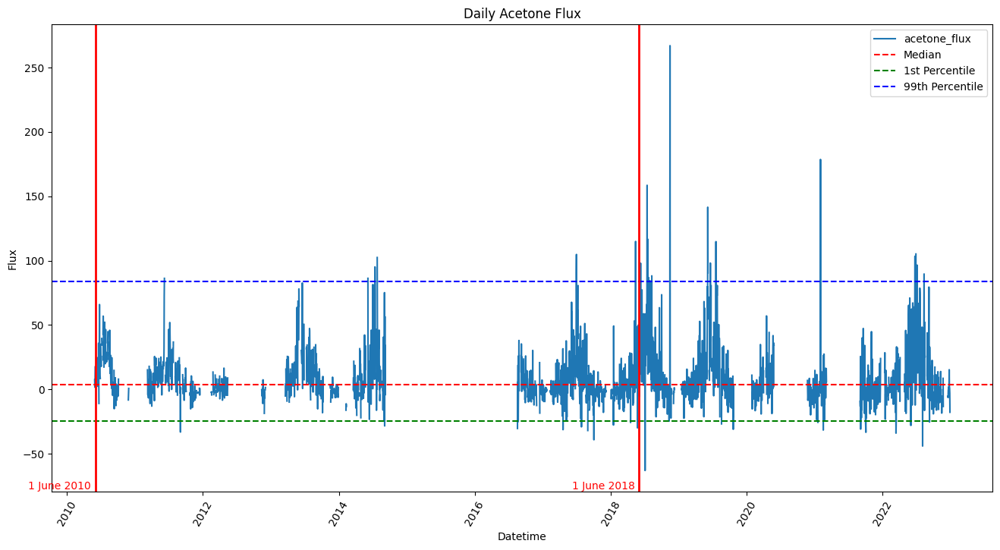

In [26]:
# Calculate median and the percentiles
median = daily_df2['acetone_flux'].median()
q01 = daily_df2['acetone_flux'].quantile(0.01)
q99 = daily_df2['acetone_flux'].quantile(0.99)

# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the lines
ax.plot(daily_df2['Datetime'], daily_df2['acetone_flux'], label='acetone_flux')
ax.axhline(y=median, color='r', linestyle='--', label='Median')
ax.axhline(y=q01, color='g', linestyle='--', label='1st Percentile')
ax.axhline(y=q99, color='b', linestyle='--', label='99th Percentile')

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Daily Acetone Flux')
ax.legend()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
# ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
# ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-75, 125)

# plt.tight_layout()
plt.show()

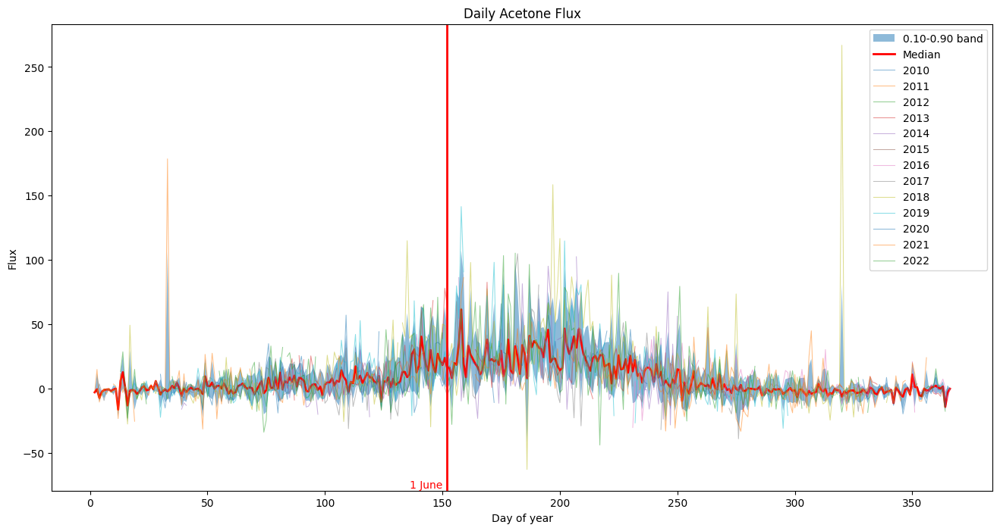

In [27]:
# Create a copy of the dataframe to avoid modifying the original
daily_df5_years = daily_df2.copy()

# Add a column for the day of year
daily_df5_years['day'] = daily_df5_years['Datetime'].dt.dayofyear

# Add a column for the year
daily_df5_years['year'] = daily_df5_years['Datetime'].dt.year

# Drop the column 'Datetime'
daily_df5_years = daily_df5_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are weeks and columns are years
daily_df5_years = daily_df5_years.pivot(index='day', columns='year', values='acetone_flux')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(daily_df5_years.index, daily_df5_years.quantile(0.1, axis=1), daily_df5_years.quantile(0.9, axis=1), alpha=0.5)

# Plot the median
daily_df5_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individual years
daily_df5_years.plot(ax=ax, alpha=0.5, linewidth=0.75)

# Add labels, title, and legend
ax.set_xlabel('Day of year')
ax.set_ylabel('Flux')
ax.set_title('Daily Acetone Flux')
# ax.legend(['Median'] + daily_df2_years.columns.tolist(), loc='upper right')
ax.legend(['0.10-0.90 band', 'Median'] + daily_df5_years.columns.tolist(), loc='upper right')

# Highlight the period of interest
ax.axvline(152, color='r', lw=2)

# Add labels to the lines
ax.text(150, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-75, 125)

# plt.tight_layout()
plt.show()


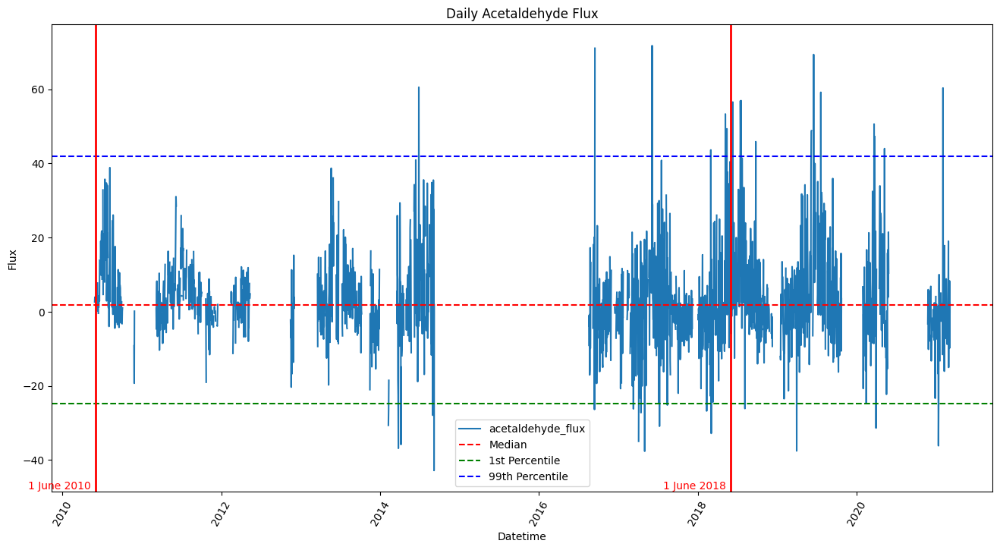

In [28]:
# Calculate median and the percentiles
median = daily_df2['acetaldehyde_flux'].median()
q01 = daily_df2['acetaldehyde_flux'].quantile(0.01)
q99 = daily_df2['acetaldehyde_flux'].quantile(0.99)

# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the lines
ax.plot(daily_df2['Datetime'], daily_df2['acetaldehyde_flux'], label='acetaldehyde_flux')
ax.axhline(y=median, color='r', linestyle='--', label='Median')
ax.axhline(y=q01, color='g', linestyle='--', label='1st Percentile')
ax.axhline(y=q99, color='b', linestyle='--', label='99th Percentile')

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Daily Acetaldehyde Flux')
ax.legend()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
# ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
# ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-75, 125)

# plt.tight_layout()
plt.show()

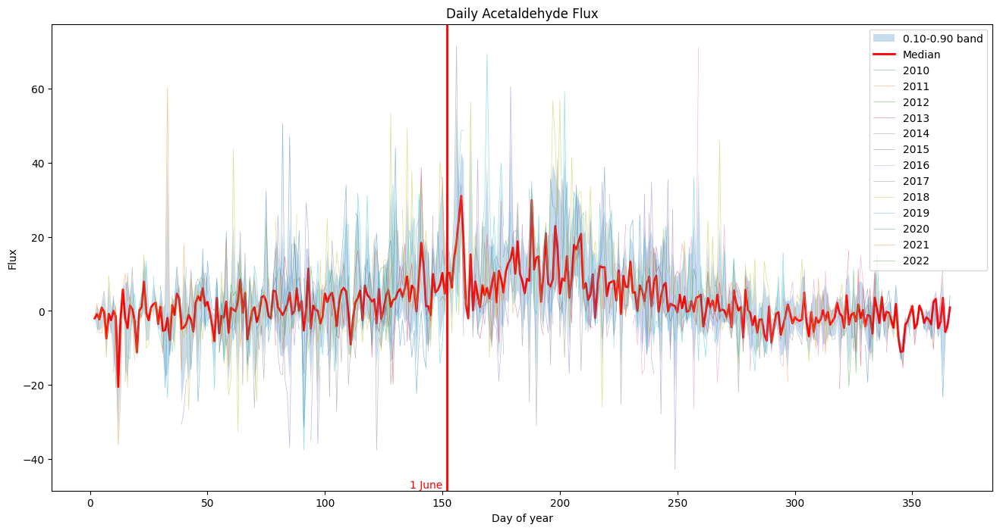

In [29]:
# Create a copy of the dataframe to avoid modifying the original
daily_df5_years = daily_df2.copy()

# Add a column for the day of year
daily_df5_years['day'] = daily_df5_years['Datetime'].dt.dayofyear

# Add a column for the year
daily_df5_years['year'] = daily_df5_years['Datetime'].dt.year

# Drop the column 'Datetime'
daily_df5_years = daily_df5_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are weeks and columns are years
daily_df5_years = daily_df5_years.pivot(index='day', columns='year', values='acetaldehyde_flux')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(daily_df5_years.index, daily_df5_years.quantile(0.1, axis=1), daily_df5_years.quantile(0.9, axis=1), alpha=0.25)

# Plot the median
daily_df5_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individual years
daily_df5_years.plot(ax=ax, alpha=0.5, linewidth=0.5)

# Add labels, title, and legend
ax.set_xlabel('Day of year')
ax.set_ylabel('Flux')
ax.set_title('Daily Acetaldehyde Flux')
# ax.legend(['Median'] + daily_df2_years.columns.tolist(), loc='upper right')
ax.legend(['0.10-0.90 band', 'Median'] + daily_df5_years.columns.tolist(), loc='upper right')

# Highlight the period of interest
ax.axvline(152, color='r', lw=2)

# Add labels to the lines
ax.text(150, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-75, 125)

# plt.tight_layout()
plt.show()


### Latent heat flux

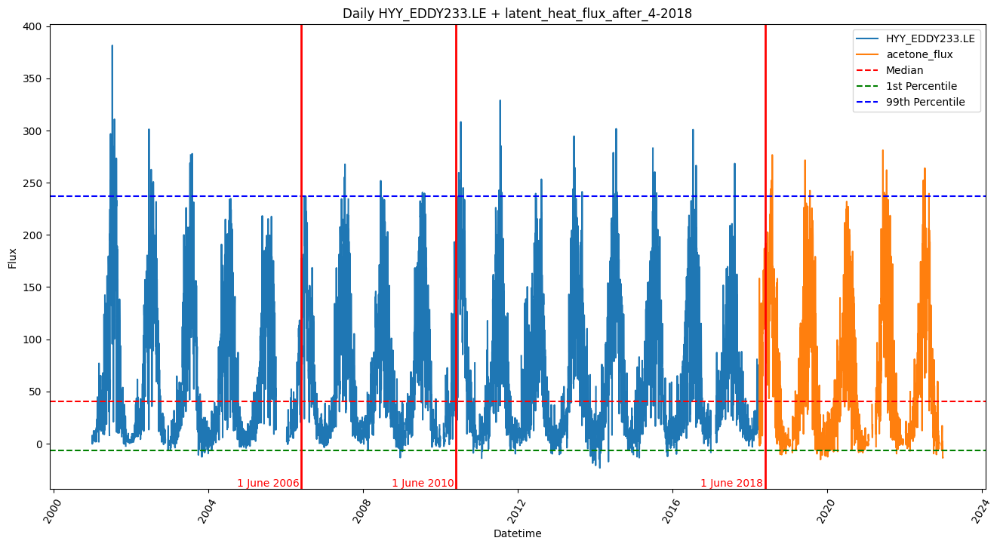

In [30]:
# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Calculate combined median and percentiles
combined_series = pd.concat([daily_df4['HYY_EDDY233.LE'], daily_df3['latent_heat_flux_after_4-2018']], axis=0)
median = combined_series.median()
q01 = combined_series.quantile(0.01)
q99 = combined_series.quantile(0.99)

# Plot the lines
ax.plot(daily_df4['Datetime'], daily_df4['HYY_EDDY233.LE'], label='HYY_EDDY233.LE')
ax.plot(daily_df3['Datetime'], daily_df3['latent_heat_flux_after_4-2018'], label='acetone_flux')
ax.axhline(y=median, color='r', linestyle='--', label='Median')
ax.axhline(y=q01, color='g', linestyle='--', label='1st Percentile')
ax.axhline(y=q99, color='b', linestyle='--', label='99th Percentile')

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Daily HYY_EDDY233.LE + latent_heat_flux_after_4-2018')
ax.legend()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-50, 125)

# plt.tight_layout()
plt.show()

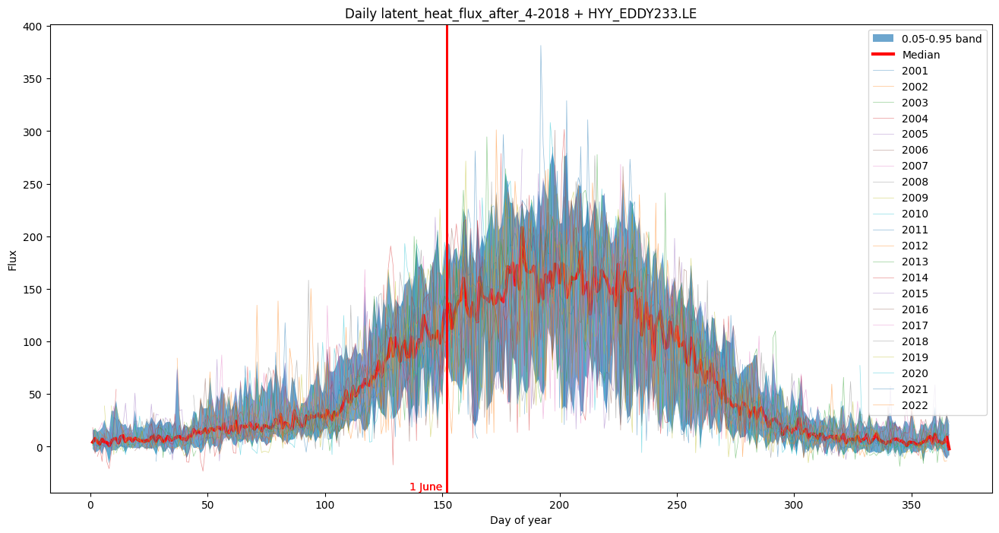

In [31]:
# Create a copy of the dataframe to avoid modifying the original
daily_df3_years = daily_df3.copy()
daily_df4_years = daily_df4.copy()

# Rename columns to 'flux'
daily_df3_years = daily_df3_years.rename(columns={'latent_heat_flux_after_4-2018': 'flux'})
daily_df4_years = daily_df4_years.rename(columns={'HYY_EDDY233.LE': 'flux'})

#Concatenate the dataframes
daily_df34_years = pd.concat([daily_df4_years[['Datetime', 'flux']],
                        daily_df3_years[['Datetime', 'flux']]],
                       ignore_index=True)

# Add a column for the day of year
daily_df34_years['day'] = daily_df34_years['Datetime'].dt.dayofyear

# Add a column for the year
daily_df34_years['year'] = daily_df34_years['Datetime'].dt.year

# Drop the column 'Datetime'
daily_df34_years = daily_df34_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are weeks and columns are years
daily_df34_years = daily_df34_years.pivot(index='day', columns='year', values='flux')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(daily_df34_years.index, daily_df34_years.quantile(0.05, axis=1), daily_df34_years.quantile(0.95, axis=1), alpha=0.65)

# Plot the median
daily_df34_years.median(axis=1).plot(ax=ax, color='r', linewidth=3)

# Plot the individual years
daily_df34_years.plot(ax=ax, alpha=0.5, linewidth=0.5)

# Add labels, title, and legend
ax.set_xlabel('Day of year')
ax.set_ylabel('Flux')
ax.set_title('Daily latent_heat_flux_after_4-2018 + HYY_EDDY233.LE')
# ax.legend(['Median'] + daily_df34_years.columns.tolist(), loc='upper right')
ax.legend(['0.05-0.95 band', 'Median'] + daily_df34_years.columns.tolist(), loc='upper right')

# Highlight the period of interest
ax.axvline(152, color='r', lw=2)

# Add labels to the lines
ax.text(150, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# Highlight the period of interest
ax.axvline(152, color='r', lw=2)

# Add labels to the lines
ax.text(150, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-30, 50)

# plt.tight_layout()
plt.show()


### Sensible heat flux

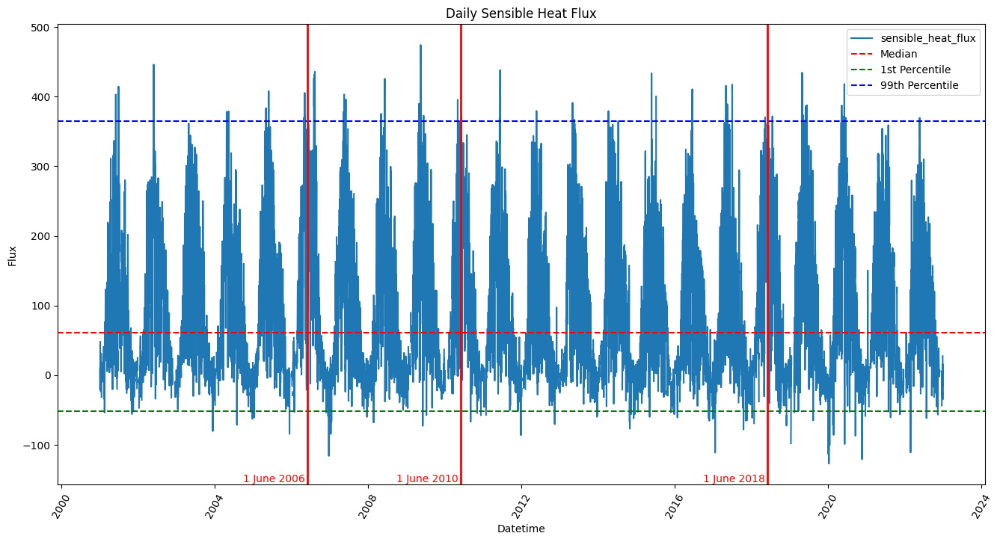

In [32]:
# Calculate median and the percentiles
median = daily_df5['sensible_heat_flux'].median()
q01 = daily_df5['sensible_heat_flux'].quantile(0.01)
q99 = daily_df5['sensible_heat_flux'].quantile(0.99)

# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the lines
ax.plot(daily_df5['Datetime'], daily_df5['sensible_heat_flux'], label='sensible_heat_flux')
ax.axhline(y=median, color='r', linestyle='--', label='Median')
ax.axhline(y=q01, color='g', linestyle='--', label='1st Percentile')
ax.axhline(y=q99, color='b', linestyle='--', label='99th Percentile')

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Daily Sensible Heat Flux')
ax.legend()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

# plt.tight_layout()
plt.show()

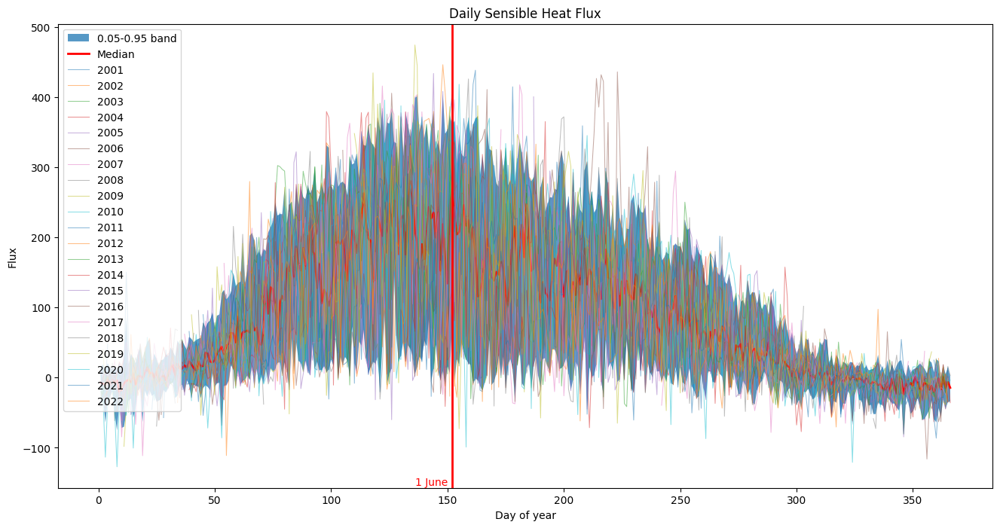

In [33]:
# Create a copy of the dataframe to avoid modifying the original
daily_df5_years = daily_df5.copy()

# Add a column for the day of year
daily_df5_years['day'] = daily_df5_years['Datetime'].dt.dayofyear

# Add a column for the year
daily_df5_years['year'] = daily_df5_years['Datetime'].dt.year

# Drop the column 'Datetime'
daily_df5_years = daily_df5_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are weeks and columns are years
daily_df5_years = daily_df5_years.pivot(index='day', columns='year', values='sensible_heat_flux')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(daily_df5_years.index, daily_df5_years.quantile(0.05, axis=1), daily_df5_years.quantile(0.95, axis=1), alpha=0.75)

# Plot the median
daily_df5_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individiual years
daily_df5_years.plot(ax=ax, alpha=0.5, linewidth=0.75)

# Add labels, title, and legend
ax.set_xlabel('Day of year')
ax.set_ylabel('Flux')
ax.set_title('Daily Sensible Heat Flux')
# ax.legend(['Median'] + daily_df5_years.columns.tolist(), loc='upper left')
ax.legend(['0.05-0.95 band', 'Median'] + daily_df5_years.columns.tolist(), loc='upper left')

# Highlight the period of interest
ax.axvline(152, color='r', lw=2)

# Add labels to the lines
ax.text(150, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# plt.tight_layout()
plt.show()

## Weekly data

In [34]:
# Aggregate to weekly resolution
if agg_method == 'mean':
    weekly_df1 = df1.resample('W', on = 'Datetime').mean().reset_index()
    weekly_df2 = df2.resample('W', on = 'Datetime').mean().reset_index()
    weekly_df3 = df3.resample('W', on = 'Datetime').mean().reset_index()
    weekly_df4 = df4.resample('W', on = 'Datetime').mean().reset_index()
    weekly_df5 = df5.resample('W', on = 'Datetime').mean().reset_index()
elif agg_method == 'median':
    weekly_df1 = df1.resample('W', on = 'Datetime').median().reset_index()
    weekly_df2 = df2.resample('W', on = 'Datetime').median().reset_index()
    weekly_df3 = df3.resample('W', on = 'Datetime').median().reset_index()
    weekly_df4 = df4.resample('W', on = 'Datetime').median().reset_index()
    weekly_df5 = df5.resample('W', on = 'Datetime').median().reset_index()
else:
    raise ValueError('agg_method must be either "mean" or "median"')

### NEE flux

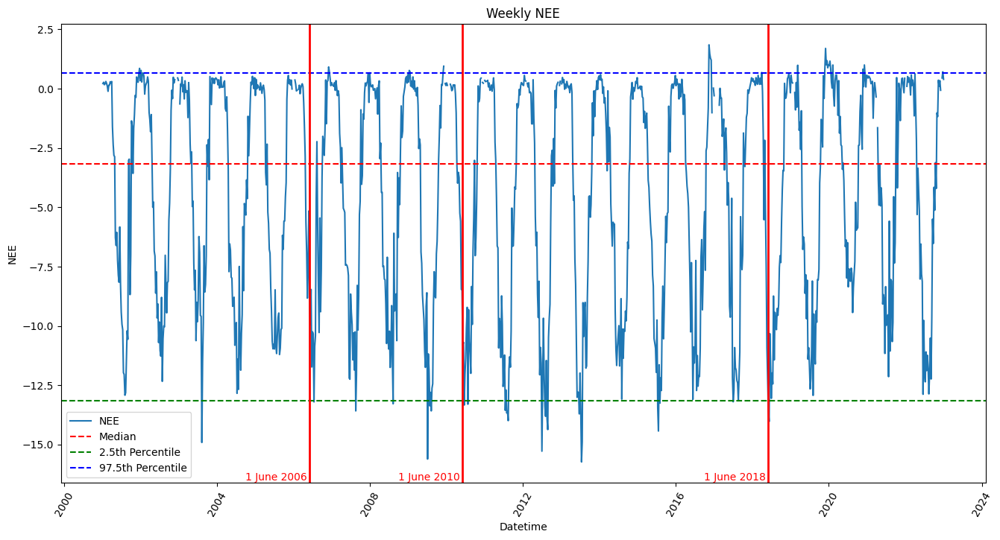

In [35]:
# Calculate median and the percentiles
median = weekly_df1['NEE'].median()
q025 = weekly_df1['NEE'].quantile(0.025)
q975 = weekly_df1['NEE'].quantile(0.975)

# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the lines
ax.plot(weekly_df1['Datetime'] , weekly_df1['NEE'], label='NEE')
ax.axhline(y=median, color='r', linestyle='--', label='Median')
ax.axhline(y=q025, color='g', linestyle='--', label='2.5th Percentile')
ax.axhline(y=q975, color='b', linestyle='--', label='97.5th Percentile')

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('NEE')
ax.set_title('Weekly NEE')
ax.legend()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-30, 50)

# plt.tight_layout()
plt.show()


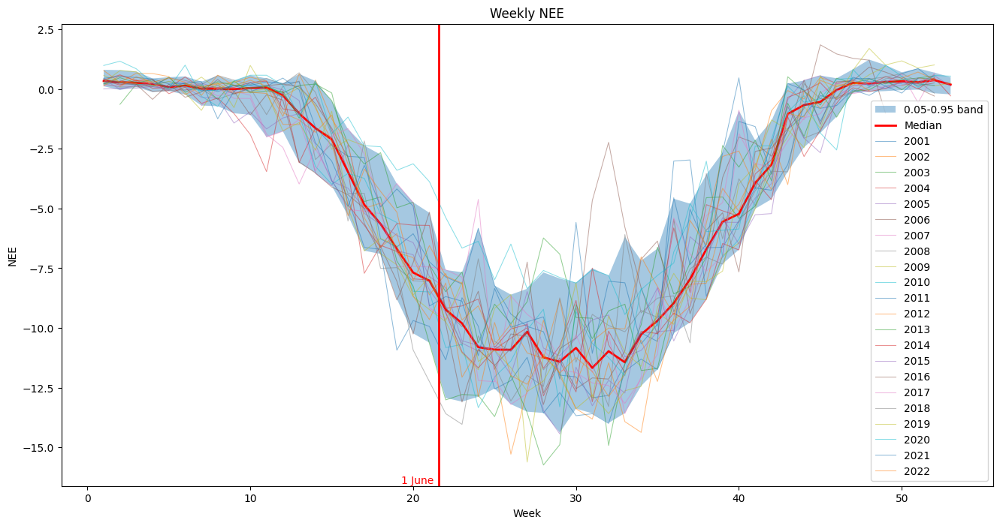

In [36]:
# Create a copy of the dataframe to avoid modifying the original
weekly_df1_years = weekly_df1.copy()

# Add a column for the week number
weekly_df1_years['week'] = weekly_df1_years['Datetime'].dt.isocalendar().week

# Add a column for the year
weekly_df1_years['year'] = weekly_df1_years['Datetime'].dt.isocalendar().year

# Drop the column 'Datetime'
weekly_df1_years = weekly_df1_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are weeks and columns are years
weekly_df1_years = weekly_df1_years.pivot(index='week', columns='year', values='NEE')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the 5th-95th percentile band
ax.fill_between(weekly_df1_years.index, weekly_df1_years.quantile(0.05, axis=1), weekly_df1_years.quantile(0.95, axis=1), alpha=0.4)

# Plot the median
weekly_df1_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individiual years
weekly_df1_years.plot(ax=ax, alpha=0.5, linewidth=0.75)

# Add labels, title, and legend
ax.set_xlabel('Week')
ax.set_ylabel('NEE')
ax.set_title('Weekly NEE')
ax.legend(['0.05-0.95 band', 'Median'] + weekly_df1_years.columns.tolist(), loc='lower right')
# ax.legend(['Median'] + weekly_df1_years.columns.tolist(), loc='lower right')

# Highlight the period of interest
ax.axvline(21.57, color='r', lw=2)

# Add labels to the lines
ax.text(21.25, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-30, 50)

# plt.tight_layout()
plt.show()

### VOC

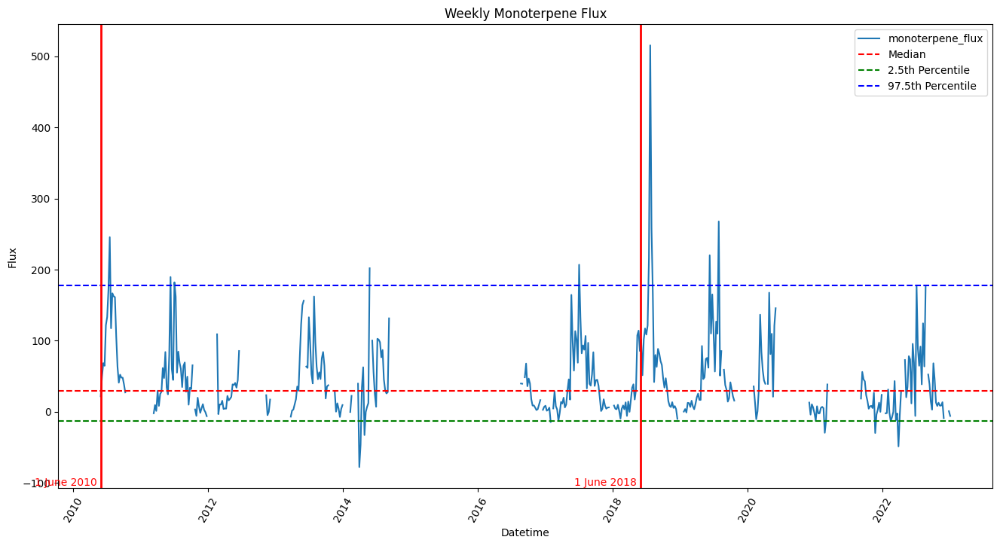

In [37]:
# Calculate median and the percentiles
median = weekly_df2['monoterpene_flux'].median()
q025 = weekly_df2['monoterpene_flux'].quantile(0.025)
q975 = weekly_df2['monoterpene_flux'].quantile(0.975)

# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the lines
ax.plot(weekly_df2['Datetime'], weekly_df2['monoterpene_flux'], label='monoterpene_flux')
ax.axhline(y=median, color='r', linestyle='--', label='Median')
ax.axhline(y=q025, color='g', linestyle='--', label='2.5th Percentile')
ax.axhline(y=q975, color='b', linestyle='--', label='97.5th Percentile')

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Weekly Monoterpene Flux')
ax.legend()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
# ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
# ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-30, 250)

# plt.tight_layout()
plt.show()

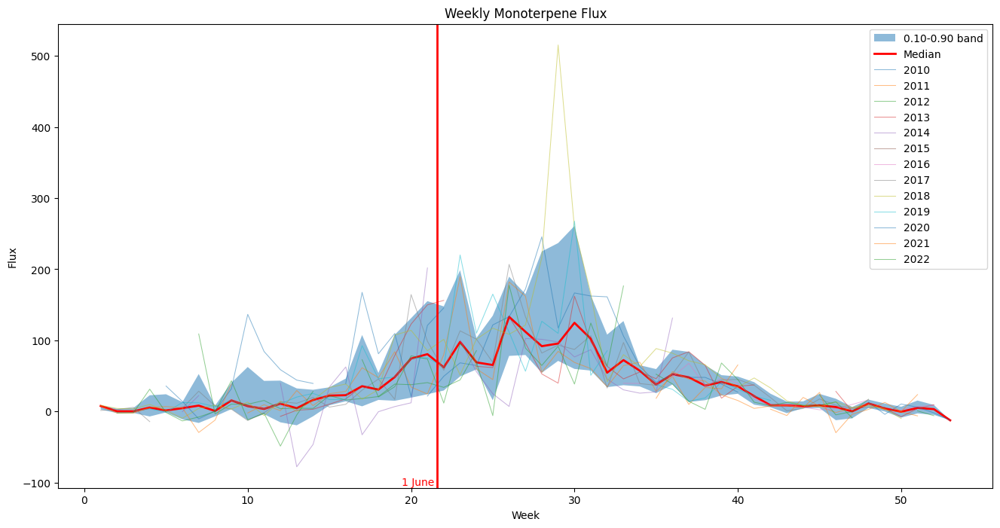

In [38]:
# Create a copy of the dataframe to avoid modifying the original
weekly_df2_years = weekly_df2.copy()

# Add a column for the week number
weekly_df2_years['week'] = weekly_df2_years['Datetime'].dt.isocalendar().week

# Add a column for the year
weekly_df2_years['year'] = weekly_df2_years['Datetime'].dt.isocalendar().year

# Drop the column 'Datetime'
weekly_df2_years = weekly_df2_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are weeks and columns are years
weekly_df2_years = weekly_df2_years.pivot(index='week', columns='year', values='monoterpene_flux')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the 5th-95th percentile band
ax.fill_between(weekly_df2_years.index, weekly_df2_years.quantile(0.1, axis=1), weekly_df2_years.quantile(0.9, axis=1), alpha=0.5)

# Plot the median
weekly_df2_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individiual years
weekly_df2_years.plot(ax=ax, alpha=0.5, linewidth=0.75)

# Add labels, title, and legend
ax.set_xlabel('Week')
ax.set_ylabel('Flux')
ax.set_title('Weekly Monoterpene Flux')
ax.legend(['0.10-0.90 band', 'Median'] + weekly_df2_years.columns.tolist(), loc='upper right')
# ax.legend(['Median'] + weekly_df2_years.columns.tolist(), loc='upper right')

# Highlight the period of interest
ax.axvline(21.57, color='r', lw=2)

# Add labels to the lines
ax.text(21.4, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-30, 250)

# plt.tight_layout()
plt.show()

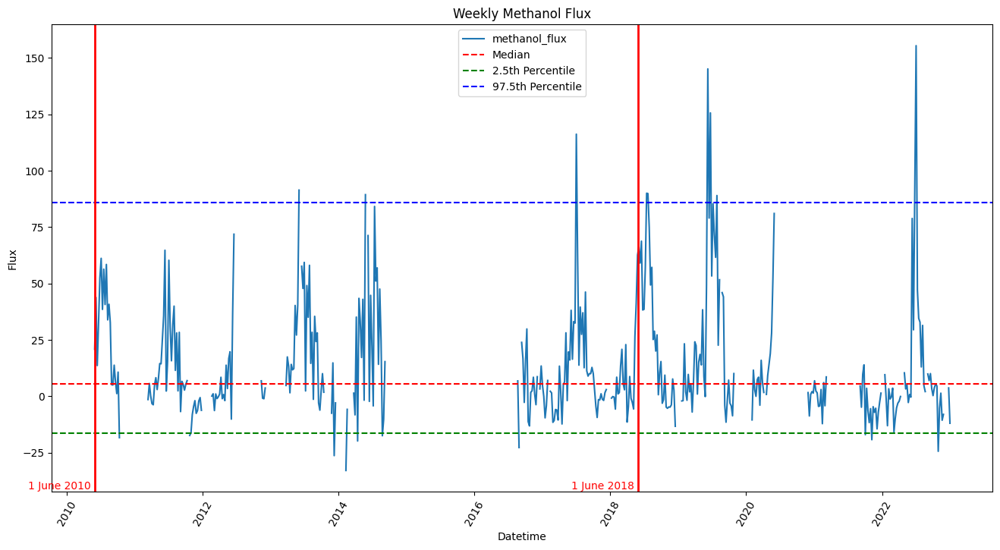

In [39]:
# Calculate median, 10th and 90th percentiles
median = weekly_df2['methanol_flux'].median()
q025 = weekly_df2['methanol_flux'].quantile(0.025)
q975 = weekly_df2['methanol_flux'].quantile(0.975)

# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the lines
ax.plot(weekly_df2['Datetime'] , weekly_df2['methanol_flux'], label='methanol_flux')
ax.axhline(y=median, color='r', linestyle='--', label='Median')
ax.axhline(y=q025, color='g', linestyle='--', label='2.5th Percentile')
ax.axhline(y=q975, color='b', linestyle='--', label='97.5th Percentile')

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Weekly Methanol Flux')
ax.legend()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
# ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
# ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-30, 250)

# plt.tight_layout()
plt.show()


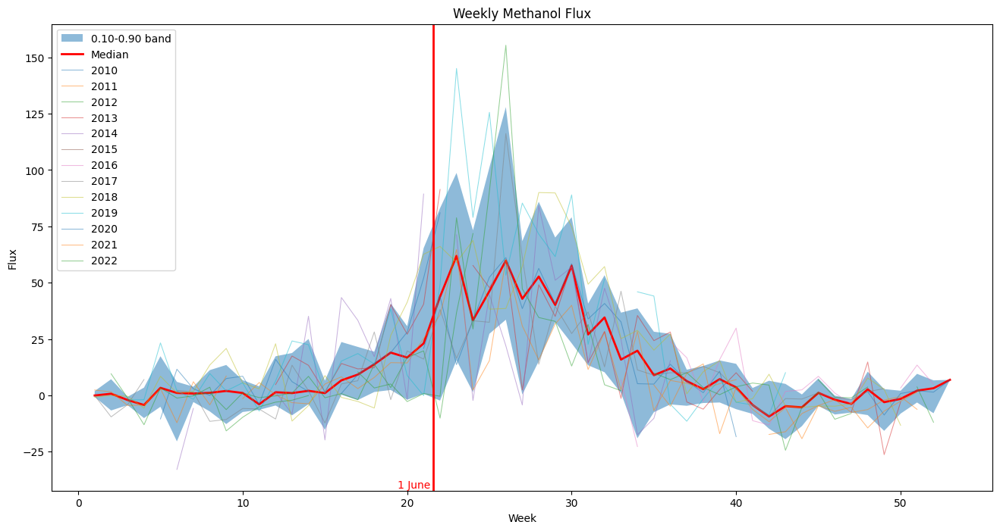

In [40]:
# Create a copy of the dataframe to avoid modifying the original
weekly_df2_years = weekly_df2.copy()

# Add a column for the week number
weekly_df2_years['week'] = weekly_df2_years['Datetime'].dt.isocalendar().week

# Add a column for the year
weekly_df2_years['year'] = weekly_df2_years['Datetime'].dt.isocalendar().year

# Drop the column 'Datetime'
weekly_df2_years = weekly_df2_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are weeks and columns are years
weekly_df2_years = weekly_df2_years.pivot(index='week', columns='year', values='methanol_flux')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the 5th-95th percentile band
ax.fill_between(weekly_df2_years.index, weekly_df2_years.quantile(0.1, axis=1), weekly_df2_years.quantile(0.9, axis=1), alpha=0.5)

# Plot the median
weekly_df2_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individiual years
weekly_df2_years.plot(ax=ax, alpha=0.5, linewidth=0.75)

# Add labels, title, and legend
ax.set_xlabel('Week')
ax.set_ylabel('Flux')
ax.set_title('Weekly Methanol Flux')
ax.legend(['0.10-0.90 band', 'Median'] + weekly_df2_years.columns.tolist(), loc='upper left')
# ax.legend(['Median'] + weekly_df2_years.columns.tolist(), loc='upper left')

# Highlight the period of interest
ax.axvline(21.57, color='r', lw=2)

# Add labels to the lines
ax.text(21.4, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-30, 250)

# plt.tight_layout()
plt.show()

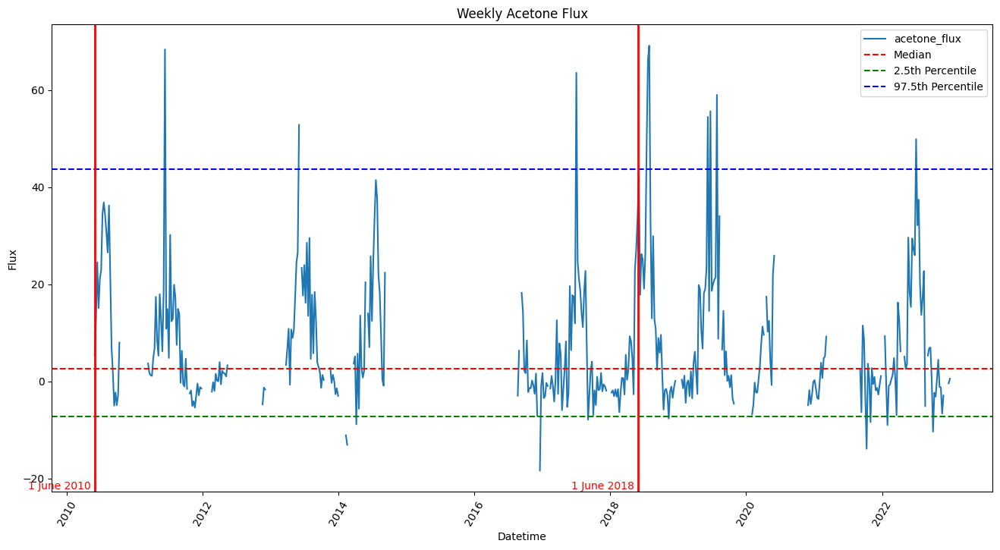

In [41]:
# Calculate median and percentiles
median = weekly_df2['acetone_flux'].median()
q025 = weekly_df2['acetone_flux'].quantile(0.025)
q975 = weekly_df2['acetone_flux'].quantile(0.975)

# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the lines
ax.plot(weekly_df2['Datetime'], weekly_df2['acetone_flux'], label='acetone_flux')
ax.axhline(y=median, color='r', linestyle='--', label='Median')
ax.axhline(y=q025, color='g', linestyle='--', label='2.5th Percentile')
ax.axhline(y=q975, color='b', linestyle='--', label='97.5th Percentile')

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Weekly Acetone Flux')
ax.legend()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
# ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
# ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-40, 60)

# plt.tight_layout()
plt.show()

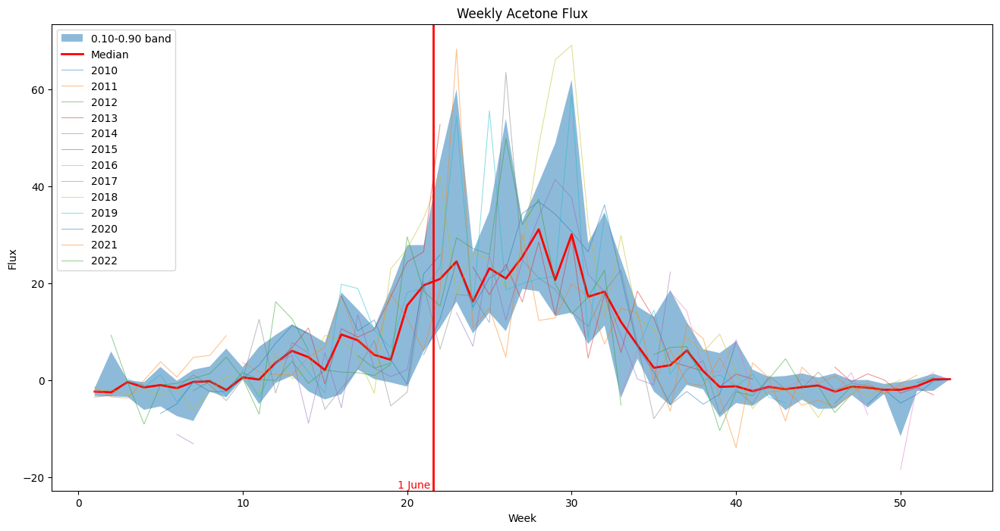

In [42]:
# Create a copy of the dataframe to avoid modifying the original
weekly_df2_years = weekly_df2.copy()

# Add a column for the week number
weekly_df2_years['week'] = weekly_df2_years['Datetime'].dt.isocalendar().week

# Add a column for the year
weekly_df2_years['year'] = weekly_df2_years['Datetime'].dt.isocalendar().year

# Drop the column 'Datetime'
weekly_df2_years = weekly_df2_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are weeks and columns are years
weekly_df2_years = weekly_df2_years.pivot(index='week', columns='year', values='acetone_flux')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the 5th-95th percentile band
ax.fill_between(weekly_df2_years.index, weekly_df2_years.quantile(0.1, axis=1), weekly_df2_years.quantile(0.9, axis=1), alpha=0.5)

# Plot the median
weekly_df2_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individiual years
weekly_df2_years.plot(ax=ax, alpha=0.5, linewidth=0.75)

# Add labels, title, and legend
ax.set_xlabel('Week')
ax.set_ylabel('Flux')
ax.set_title('Weekly Acetone Flux')
ax.legend(['0.10-0.90 band', 'Median'] + weekly_df2_years.columns.tolist(), loc='upper left')
# ax.legend(['Median'] + weekly_df2_years.columns.tolist(), loc='upper left')

# Highlight the period of interest
ax.axvline(21.57, color='r', lw=2)

# Add labels to the lines
ax.text(21.4, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-40, 60)

# plt.tight_layout()
plt.show()

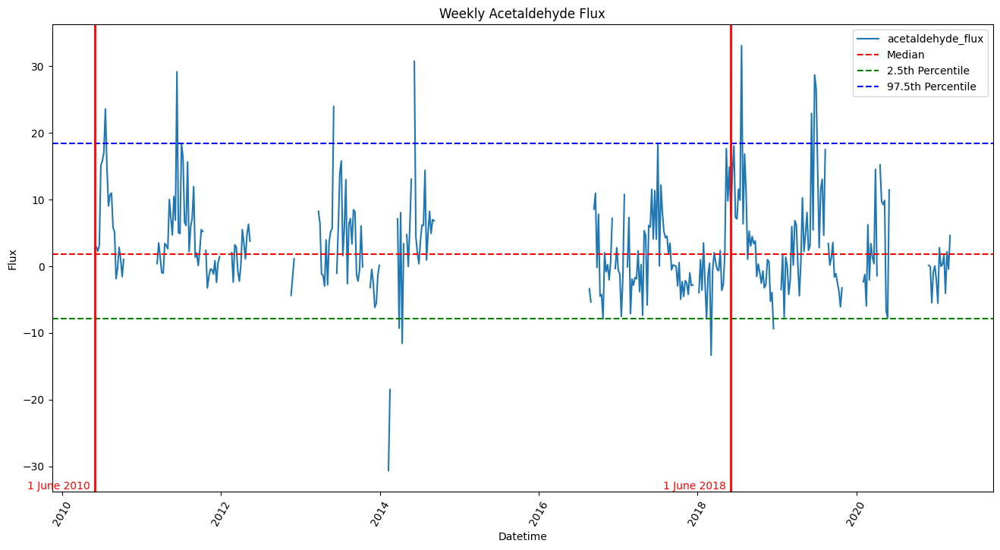

In [43]:
# Calculate median and the percentiles
median = weekly_df2['acetaldehyde_flux'].median()
q025 = weekly_df2['acetaldehyde_flux'].quantile(0.025)
q975 = weekly_df2['acetaldehyde_flux'].quantile(0.975)

# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the lines
ax.plot(weekly_df2['Datetime'], weekly_df2['acetaldehyde_flux'], label='acetaldehyde_flux')
ax.axhline(y=median, color='r', linestyle='--', label='Median')
ax.axhline(y=q025, color='g', linestyle='--', label='2.5th Percentile')
ax.axhline(y=q975, color='b', linestyle='--', label='97.5th Percentile')

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Weekly Acetaldehyde Flux')
ax.legend()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
# ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
# ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-40, 60)

# plt.tight_layout()
plt.show()

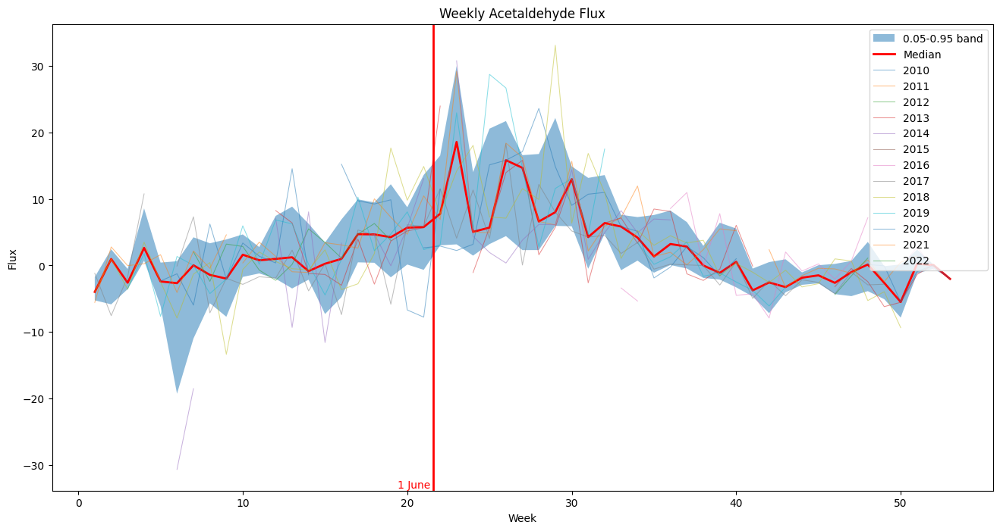

In [44]:
# Create a copy of the dataframe to avoid modifying the original
weekly_df2_years = weekly_df2.copy()

# Add a column for the week number
weekly_df2_years['week'] = weekly_df2_years['Datetime'].dt.isocalendar().week

# Add a column for the year
weekly_df2_years['year'] = weekly_df2_years['Datetime'].dt.isocalendar().year

# Drop the column 'Datetime'
weekly_df2_years = weekly_df2_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are weeks and columns are years
weekly_df2_years = weekly_df2_years.pivot(index='week', columns='year', values='acetaldehyde_flux')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the 5th-95th percentile band
ax.fill_between(weekly_df2_years.index, weekly_df2_years.quantile(0.1, axis=1), weekly_df2_years.quantile(0.9, axis=1), alpha=0.5)

# Plot the median
weekly_df2_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individiual years
weekly_df2_years.plot(ax=ax, alpha=0.5, linewidth=0.75)

# Add labels, title, and legend
ax.set_xlabel('Week')
ax.set_ylabel('Flux')
ax.set_title('Weekly Acetaldehyde Flux')
ax.legend(['0.05-0.95 band', 'Median'] + weekly_df2_years.columns.tolist(), loc='upper right')
# ax.legend(['Median'] + weekly_df2_years.columns.tolist(), loc='upper right')

# Highlight the period of interest
ax.axvline(21.57, color='r', lw=2)

# Add labels to the lines
ax.text(21.4, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-40, 60)

# plt.tight_layout()
plt.show()

### Latent heat flux

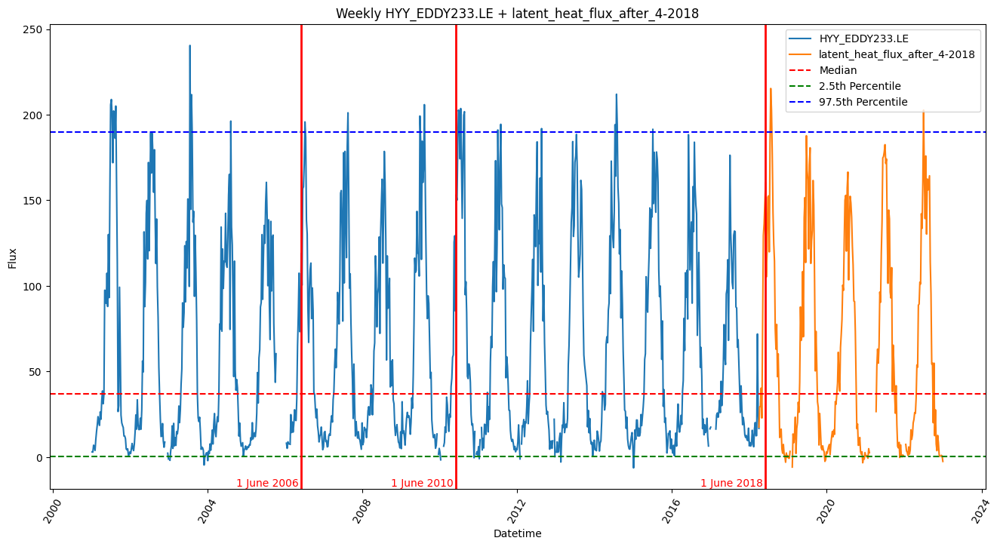

In [45]:
# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Calculate combined median and percentiles
combined_series = pd.concat([weekly_df4['HYY_EDDY233.LE'], weekly_df3['latent_heat_flux_after_4-2018']], axis=0)
median = combined_series.median()
q025 = combined_series.quantile(0.025)
q975 = combined_series.quantile(0.975)

# Plot the lines
ax.plot(weekly_df4['Datetime'], weekly_df4['HYY_EDDY233.LE'], label='HYY_EDDY233.LE')
ax.plot(weekly_df3['Datetime'], weekly_df3['latent_heat_flux_after_4-2018'], label='latent_heat_flux_after_4-2018')
ax.axhline(y=median, color='r', linestyle='--', label='Median')
ax.axhline(y=q025, color='g', linestyle='--', label='2.5th Percentile')
ax.axhline(y=q975, color='b', linestyle='--', label='97.5th Percentile')

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Weekly HYY_EDDY233.LE + latent_heat_flux_after_4-2018')
ax.legend()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-50, 125)

# plt.tight_layout()
plt.show()

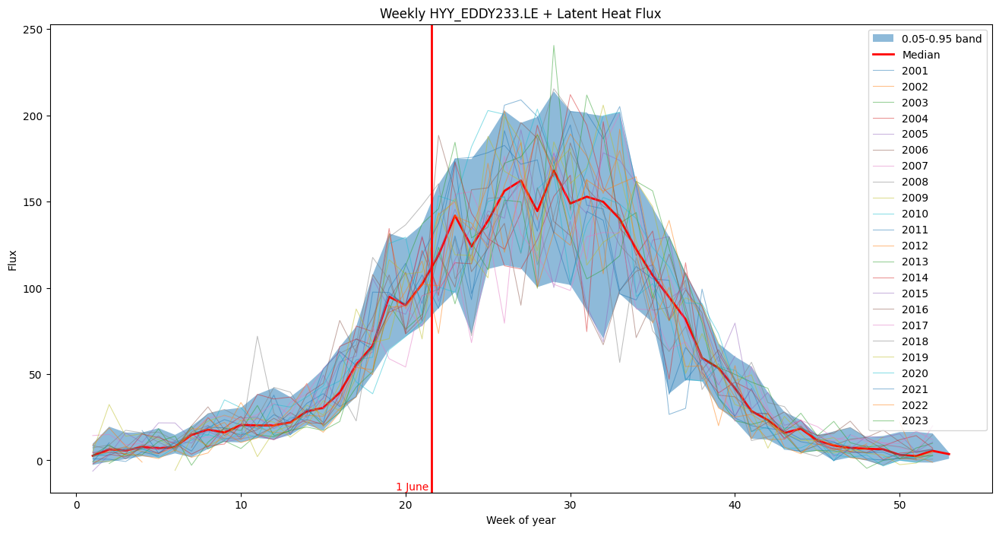

In [46]:
# Create a copy of the dataframe to avoid modifying the original
weekly_df3_years = weekly_df3.copy()
weekly_df4_years = weekly_df4.copy()

# Rename columns to 'flux'
weekly_df3_years = weekly_df3_years.rename(columns={'latent_heat_flux_after_4-2018': 'flux'})
weekly_df4_years = weekly_df4_years.rename(columns={'HYY_EDDY233.LE': 'flux'})

#Concatenate the dataframes
weekly_df34_years = pd.concat([weekly_df4_years[['Datetime', 'flux']],
                        weekly_df3_years[['Datetime', 'flux']]],
                       ignore_index=True)

# Add a column for the week of year
weekly_df34_years['week'] = weekly_df34_years['Datetime'].dt.isocalendar().week

# Add a column for the year
weekly_df34_years['year'] = weekly_df34_years['Datetime'].dt.year

# Drop the column 'Datetime'
weekly_df34_years = weekly_df34_years.drop(columns='Datetime')

# Aggregate duplicate rows by taking the mean of 'flux'
weekly_df34_years = weekly_df34_years.groupby(['week', 'year']).agg({'flux': 'mean'}).reset_index()

# Pivot the DataFrame so that rows are weeks and columns are years
weekly_df34_years = weekly_df34_years.pivot(index='week', columns='year', values='flux')

fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(weekly_df34_years.index, weekly_df34_years.quantile(0.05, axis=1), weekly_df34_years.quantile(0.95, axis=1), alpha=0.5)

# Plot the median
weekly_df34_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individual years
weekly_df34_years.plot(ax=ax, alpha=0.5, linewidth=0.75)

# Add labels, title, and legend
ax.set_xlabel('Week of year')
ax.set_ylabel('Flux')
ax.set_title('Weekly HYY_EDDY233.LE + Latent Heat Flux')
ax.legend(['0.05-0.95 band', 'Median'] + weekly_df34_years.columns.tolist(), loc='upper right')
# ax.legend(['Median'] + weekly_df34_years.columns.tolist(), loc='upper right')

# Highlight the period of interest
ax.axvline(21.57, color='r', lw=2)

# Add labels to the lines
ax.text(21.4, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-30, 50)

# plt.tight_layout()
plt.show()


### Sensible heat flux

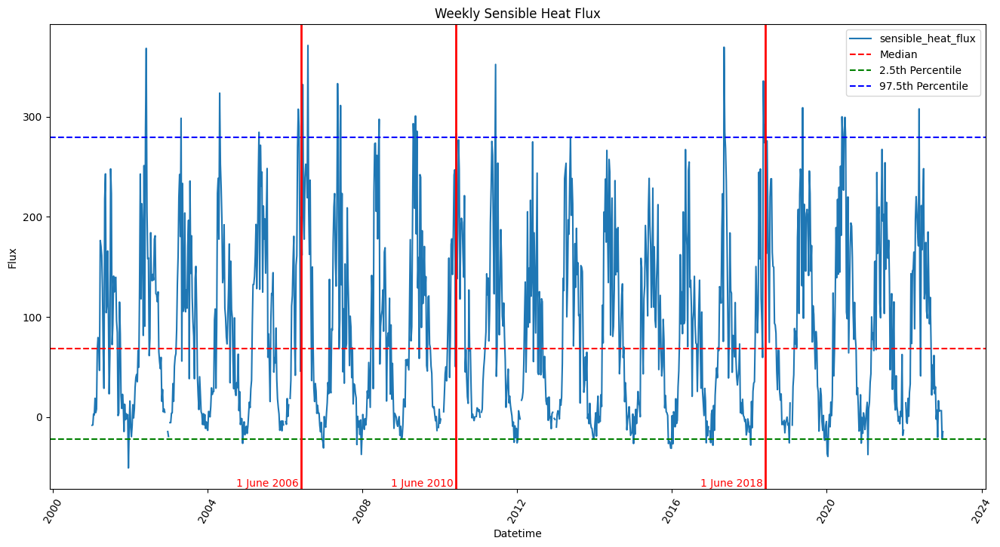

In [47]:
# Calculate median and the percentiles
median = weekly_df5['sensible_heat_flux'].median()
q025 = weekly_df5['sensible_heat_flux'].quantile(0.025)
q975 = weekly_df5['sensible_heat_flux'].quantile(0.975)

# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the lines
ax.plot(weekly_df5['Datetime'], weekly_df5['sensible_heat_flux'], label='sensible_heat_flux')
ax.axhline(y=median, color='r', linestyle='--', label='Median')
ax.axhline(y=q025, color='g', linestyle='--', label='2.5th Percentile')
ax.axhline(y=q975, color='b', linestyle='--', label='97.5th Percentile')

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Weekly Sensible Heat Flux')
ax.legend()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

# plt.tight_layout()
plt.show()

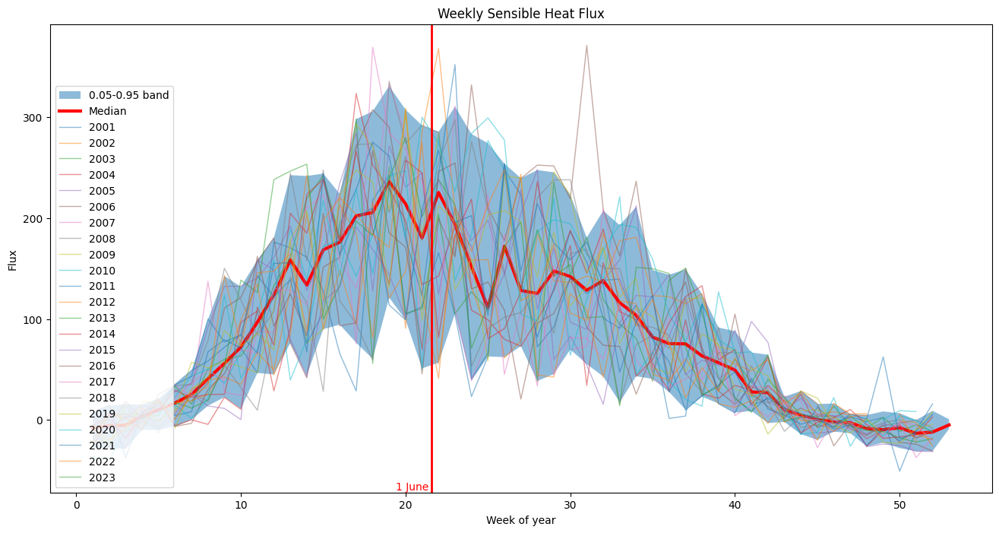

In [48]:
# Create a copy of the dataframe to avoid modifying the original
weekly_df5_years = weekly_df5.copy()

# Add a column for the week
weekly_df5_years['week'] = weekly_df5_years['Datetime'].dt.isocalendar().week

# Add a column for the year
weekly_df5_years['year'] = weekly_df5_years['Datetime'].dt.year

# Drop the column 'Datetime'
weekly_df5_years = weekly_df5_years.drop(columns='Datetime')

# Aggregate duplicate rows by taking the mean of 'flux'
weekly_df5_years = weekly_df5_years.groupby(['week', 'year']).agg({'sensible_heat_flux': 'mean'}).reset_index()

# Pivot the DataFrame so that rows are weeks and columns are years
weekly_df5_years = weekly_df5_years.pivot(index='week', columns='year', values='sensible_heat_flux')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(weekly_df5_years.index, weekly_df5_years.quantile(0.05, axis=1), weekly_df5_years.quantile(0.95, axis=1), alpha=0.5)

# Plot the median
weekly_df5_years.median(axis=1).plot(ax=ax, color='r', linewidth=3)

# Plot the individiual years
weekly_df5_years.plot(ax=ax, alpha=0.5, linewidth=1)

# Add labels, title, and legend
ax.set_xlabel('Week of year')
ax.set_ylabel('Flux')
ax.set_title('Weekly Sensible Heat Flux')
# ax.legend(['Median'] + weekly_df5_years.columns.tolist(), loc='lower left')
ax.legend(['0.05-0.95 band', 'Median'] + weekly_df5_years.columns.tolist(), loc='lower left')


# Highlight the period of interest
ax.axvline(21.57, color='r', lw=2)

# Add labels to the lines
ax.text(21.4, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# plt.tight_layout()
plt.show()


## Monthly data

In [49]:
# Aggregate to monthly resolution
if agg_method == 'mean':
    monthly_df1 = df1.resample('ME', on = 'Datetime').mean().reset_index()
    monthly_df2 = df2.resample('ME', on = 'Datetime').mean().reset_index()
    monthly_df3 = df3.resample('ME', on = 'Datetime').mean().reset_index()
    monthly_df4 = df4.resample('ME', on = 'Datetime').mean().reset_index()
    monthly_df5 = df5.resample('ME', on = 'Datetime').mean().reset_index()
elif agg_method == 'median':
    monthly_df1 = df1.resample('ME', on = 'Datetime').median().reset_index()
    monthly_df2 = df2.resample('ME', on = 'Datetime').median().reset_index()
    monthly_df3 = df3.resample('ME', on = 'Datetime').median().reset_index()
    monthly_df4 = df4.resample('ME', on = 'Datetime').median().reset_index()
    monthly_df5 = df5.resample('ME', on = 'Datetime').median().reset_index()
else:
    raise ValueError('agg_method must be either "mean" or "median"')

### NEE flux

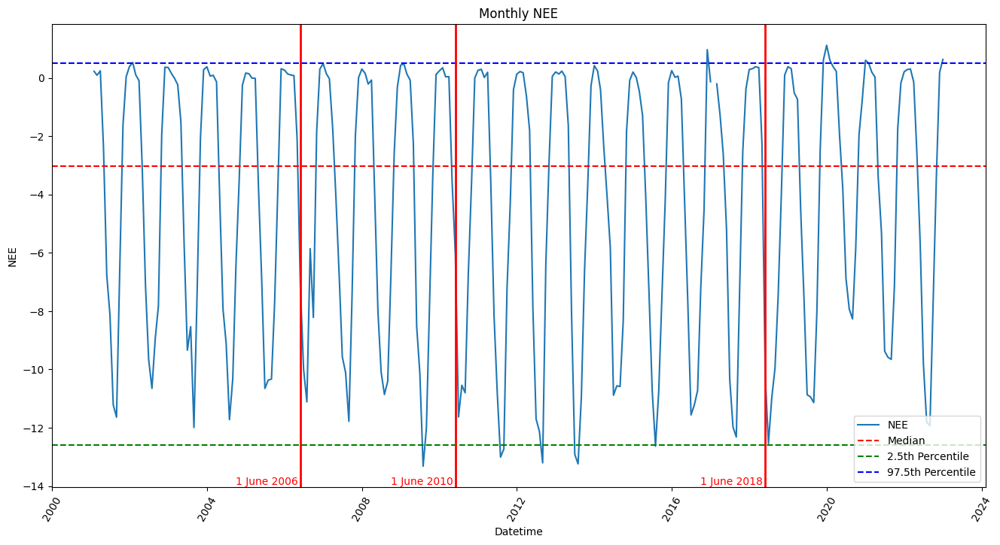

In [50]:
# Calculate median and the percentiles
median = monthly_df1['NEE'].median()
q025 = monthly_df1['NEE'].quantile(0.025)
q975 = monthly_df1['NEE'].quantile(0.975)

# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the lines
ax.plot(monthly_df1['Datetime'] , monthly_df1['NEE'], label='NEE')
ax.axhline(y=median, color='r', linestyle='--', label='Median')
ax.axhline(y=q025, color='g', linestyle='--', label='2.5th Percentile')
ax.axhline(y=q975, color='b', linestyle='--', label='97.5th Percentile')

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('NEE')
ax.set_title('Monthly NEE')
ax.legend(loc='lower right')

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-30, 50)

# plt.tight_layout()
plt.show()

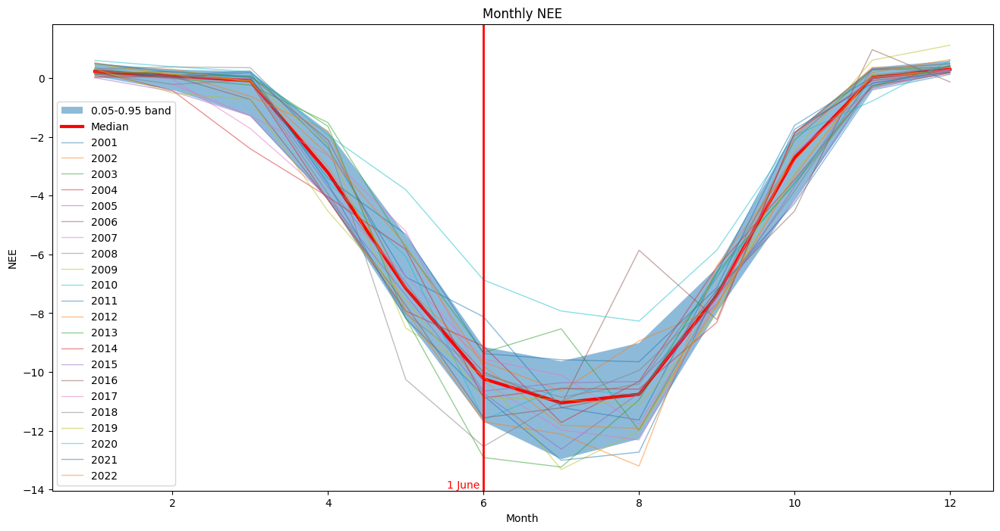

In [51]:
# Create a copy of the dataframe to avoid modifying the original
monthly_df1_years = monthly_df1.copy()

# Add a column for the month number
monthly_df1_years['month'] = monthly_df1_years['Datetime'].dt.month

# Add a column for the year
monthly_df1_years['year'] = monthly_df1_years['Datetime'].dt.year

# Drop the column 'Datetime'
monthly_df1_years = monthly_df1_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are months and columns are years
monthly_df1_years = monthly_df1_years.pivot(index='month', columns='year', values='NEE')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(monthly_df1_years.index, monthly_df1_years.quantile(0.1, axis=1), monthly_df1_years.quantile(0.9, axis=1), alpha=0.5)

# Plot the median
monthly_df1_years.median(axis=1).plot(ax=ax, color='r', linewidth=3)

# Plot the individiual years
monthly_df1_years.plot(ax=ax, alpha=0.5, linewidth=1)

# Add labels, title, and legend
ax.set_xlabel('Month')
ax.set_ylabel('NEE')
ax.set_title('Monthly NEE')
ax.legend(['0.05-0.95 band', 'Median'] + monthly_df1_years.columns.tolist(), loc='lower left')
# ax.legend(['Median'] + monthly_df1_years.columns.tolist(), loc='lower left')

# Highlight the period of interest
ax.axvline(6, color='r', lw=2)

# Add labels to the lines
ax.text(5.95, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-30, 50)

# plt.tight_layout()
plt.show()

### VOC

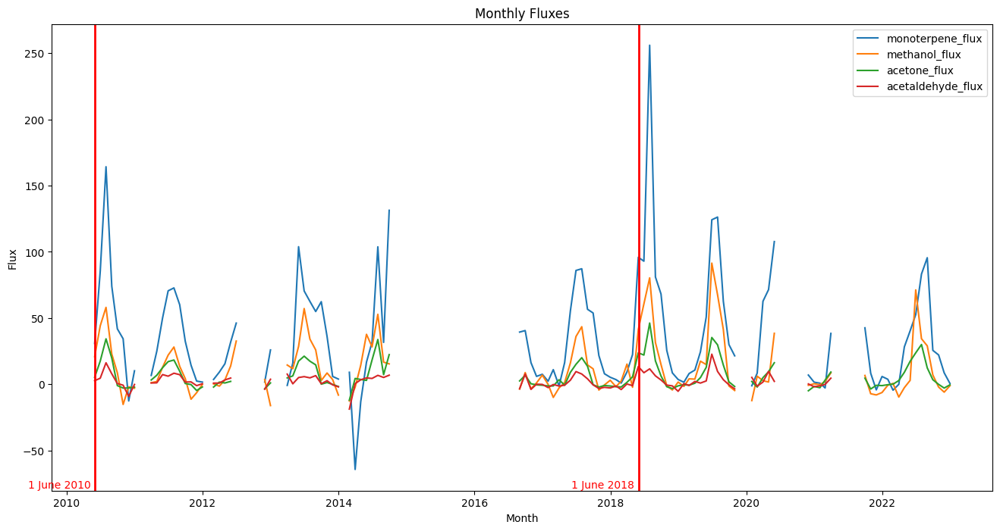

In [52]:
# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the lines
ax.plot(monthly_df2['Datetime'], monthly_df2['monoterpene_flux'], label='monoterpene_flux')
ax.plot(monthly_df2['Datetime'], monthly_df2['methanol_flux'], label='methanol_flux')
ax.plot(monthly_df2['Datetime'], monthly_df2['acetone_flux'], label='acetone_flux')
ax.plot(monthly_df2['Datetime'], monthly_df2['acetaldehyde_flux'], label='acetaldehyde_flux')

# Set plot title
ax.set_title('Monthly Fluxes')
ax.set_xlabel('Month')
ax.set_ylabel('Flux')

# Highlight the periods of interest
# ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
# ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

# Add legend
ax.legend()


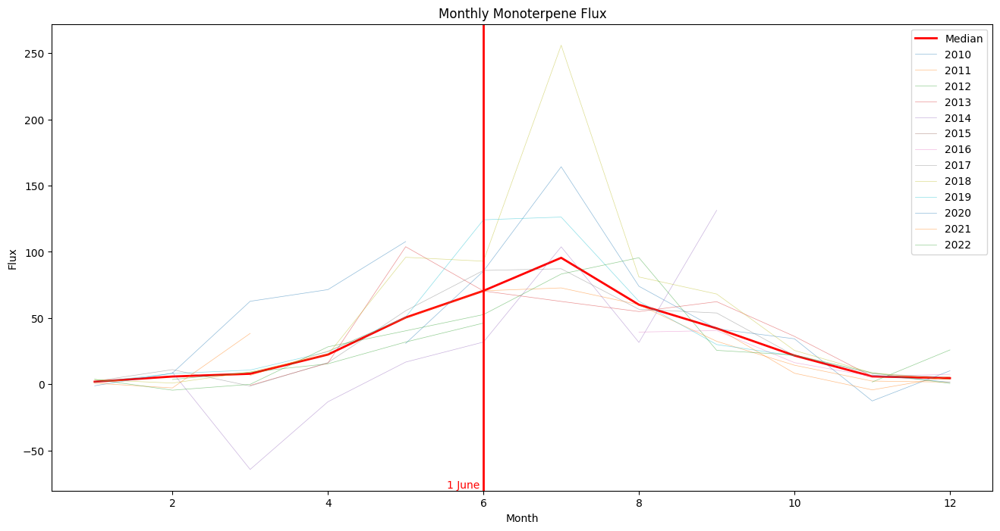

In [53]:
# Create a copy of the dataframe to avoid modifying the original
monthly_df2_years = monthly_df2.copy()

# Add a column for the month number
monthly_df2_years['month'] = monthly_df2_years['Datetime'].dt.month

# Add a column for the year
monthly_df2_years['year'] = monthly_df2_years['Datetime'].dt.year

# Drop the column 'Datetime'
monthly_df2_years = monthly_df2_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are months and columns are years
monthly_df2_years = monthly_df2_years.pivot(index='month', columns='year', values='monoterpene_flux')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
# ax.fill_between(monthly_df2_years.index, monthly_df2_years.quantile(0.05, axis=1), monthly_df2_years.quantile(0.95, axis=1), alpha=0.1)

# Plot the median
monthly_df2_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individiual years
monthly_df2_years.plot(ax=ax, alpha=0.5, linewidth=0.5)

# Add labels, title, and legend
ax.set_xlabel('Month')
ax.set_ylabel('Flux')
ax.set_title('Monthly Monoterpene Flux')
# ax.legend(['0.05-0.95 band', 'Median'] + monthly_df2_years.columns.tolist(), loc='upper right')
ax.legend(['Median'] + monthly_df2_years.columns.tolist(), loc='upper right')

# Highlight the period of interest
ax.axvline(6, color='r', lw=2)

# Add labels to the lines
ax.text(5.95, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-30, 50)

# plt.tight_layout()
plt.show()

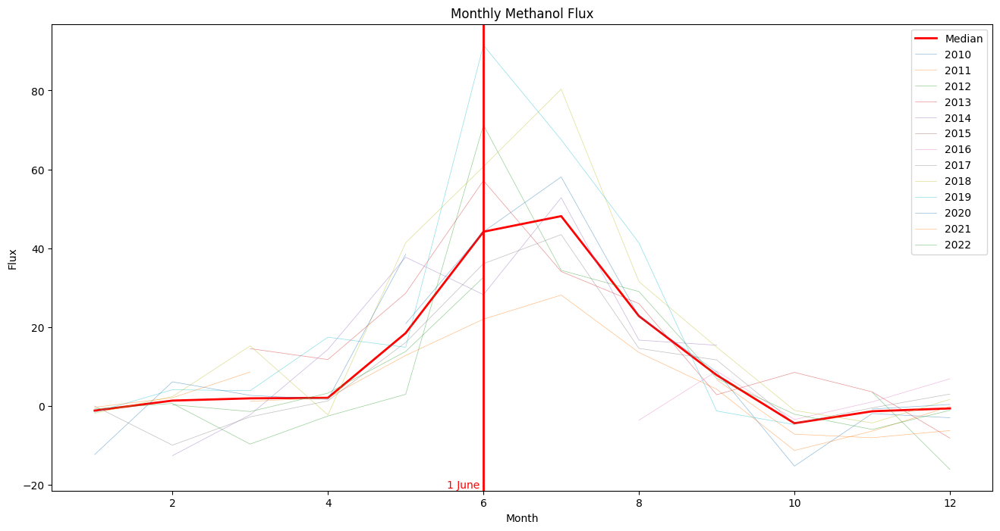

In [54]:
# Create a copy of the dataframe to avoid modifying the original
monthly_df2_years = monthly_df2.copy()

# Add a column for the month number
monthly_df2_years['month'] = monthly_df2_years['Datetime'].dt.month

# Add a column for the year
monthly_df2_years['year'] = monthly_df2_years['Datetime'].dt.year

# Drop the column 'Datetime'
monthly_df2_years = monthly_df2_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are months and columns are years
monthly_df2_years = monthly_df2_years.pivot(index='month', columns='year', values='methanol_flux')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
# ax.fill_between(monthly_df2_years.index, monthly_df2_years.quantile(0.05, axis=1), monthly_df2_years.quantile(0.95, axis=1), alpha=0.1)

# Plot the median
monthly_df2_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individiual years
monthly_df2_years.plot(ax=ax, alpha=0.5, linewidth=0.5)

# Add labels, title, and legend
ax.set_xlabel('Month')
ax.set_ylabel('Flux')
ax.set_title('Monthly Methanol Flux')
# ax.legend(['0.05-0.95 band', 'Median'] + monthly_df2_years.columns.tolist(), loc='upper right')
ax.legend(['Median'] + monthly_df2_years.columns.tolist(), loc='upper right')

# Highlight the period of interest
ax.axvline(6, color='r', lw=2)

# Add labels to the lines
ax.text(5.95, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-30, 50)

# plt.tight_layout()
plt.show()

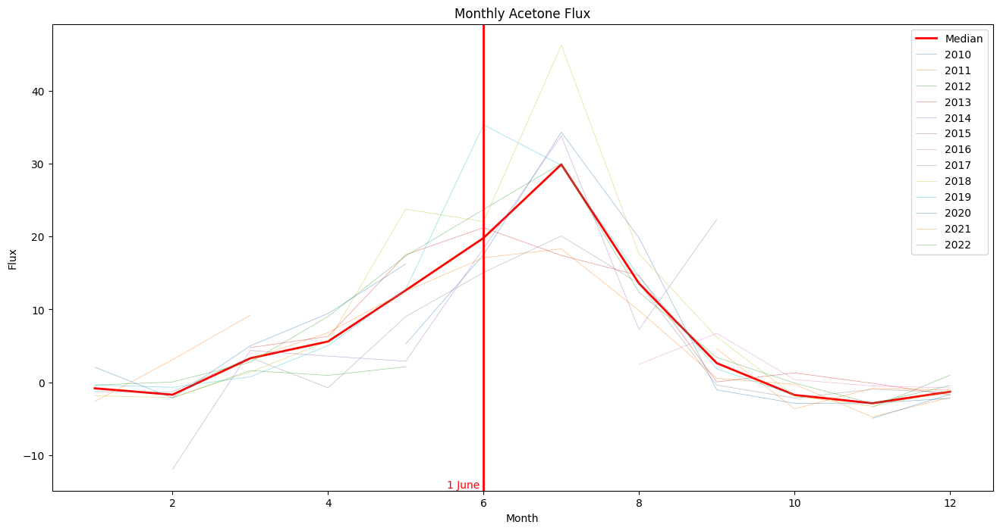

In [55]:
# Create a copy of the dataframe to avoid modifying the original
monthly_df2_years = monthly_df2.copy()

# Add a column for the month number
monthly_df2_years['month'] = monthly_df2_years['Datetime'].dt.month

# Add a column for the year
monthly_df2_years['year'] = monthly_df2_years['Datetime'].dt.year

# Drop the column 'Datetime'
monthly_df2_years = monthly_df2_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are months and columns are years
monthly_df2_years = monthly_df2_years.pivot(index='month', columns='year', values='acetone_flux')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
# ax.fill_between(monthly_df2_years.index, monthly_df2_years.quantile(0.05, axis=1), monthly_df2_years.quantile(0.95, axis=1), alpha=0.1)

# Plot the median
monthly_df2_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individiual years
monthly_df2_years.plot(ax=ax, alpha=0.5, linewidth=0.5)

# Add labels, title, and legend
ax.set_xlabel('Month')
ax.set_ylabel('Flux')
ax.set_title('Monthly Acetone Flux')
# ax.legend(['0.05-0.95 band', 'Median'] + monthly_df2_years.columns.tolist(), loc='upper right')
ax.legend(['Median'] + monthly_df2_years.columns.tolist(), loc='upper right')

# Highlight the period of interest
ax.axvline(6, color='r', lw=2)

# Add labels to the lines
ax.text(5.95, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-30, 50)

# plt.tight_layout()
plt.show()

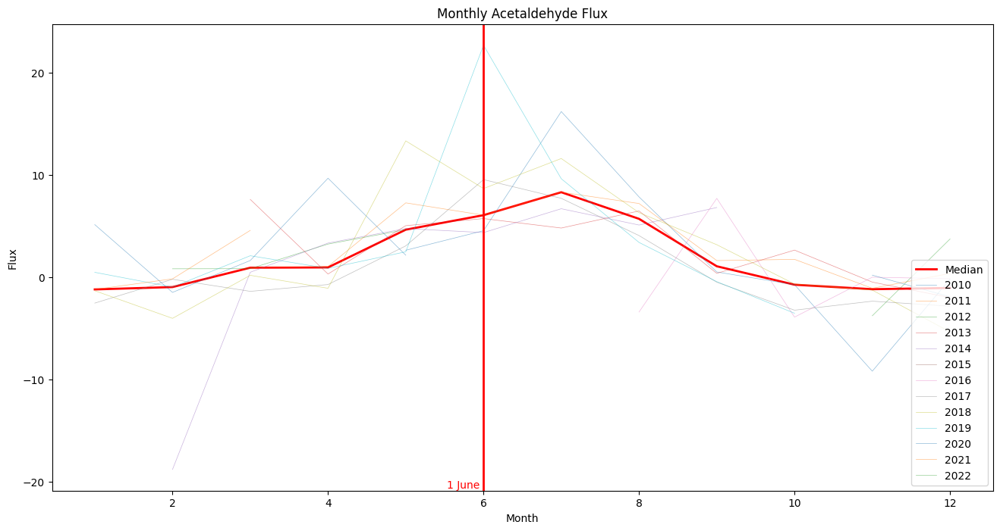

In [56]:
# Create a copy of the dataframe to avoid modifying the original
monthly_df2_years = monthly_df2.copy()

# Add a column for the month number
monthly_df2_years['month'] = monthly_df2_years['Datetime'].dt.month

# Add a column for the year
monthly_df2_years['year'] = monthly_df2_years['Datetime'].dt.year

# Drop the column 'Datetime'
monthly_df2_years = monthly_df2_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are months and columns are years
monthly_df2_years = monthly_df2_years.pivot(index='month', columns='year', values='acetaldehyde_flux')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
# ax.fill_between(monthly_df2_years.index, monthly_df2_years.quantile(0.05, axis=1), monthly_df2_years.quantile(0.95, axis=1), alpha=0.1)

# Plot the median
monthly_df2_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individiual years
monthly_df2_years.plot(ax=ax, alpha=0.5, linewidth=0.5)

# Add labels, title, and legend
ax.set_xlabel('Month')
ax.set_ylabel('Flux')
ax.set_title('Monthly Acetaldehyde Flux')
# ax.legend(['0.05-0.95 band', 'Median'] + monthly_df2_years.columns.tolist(), loc='lower right')
ax.legend(['Median'] + monthly_df2_years.columns.tolist(), loc='lower right')

# Highlight the period of interest
ax.axvline(6, color='r', lw=2)

# Add labels to the lines
ax.text(5.95, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-30, 50)

# plt.tight_layout()
plt.show()

### Latent heat flux

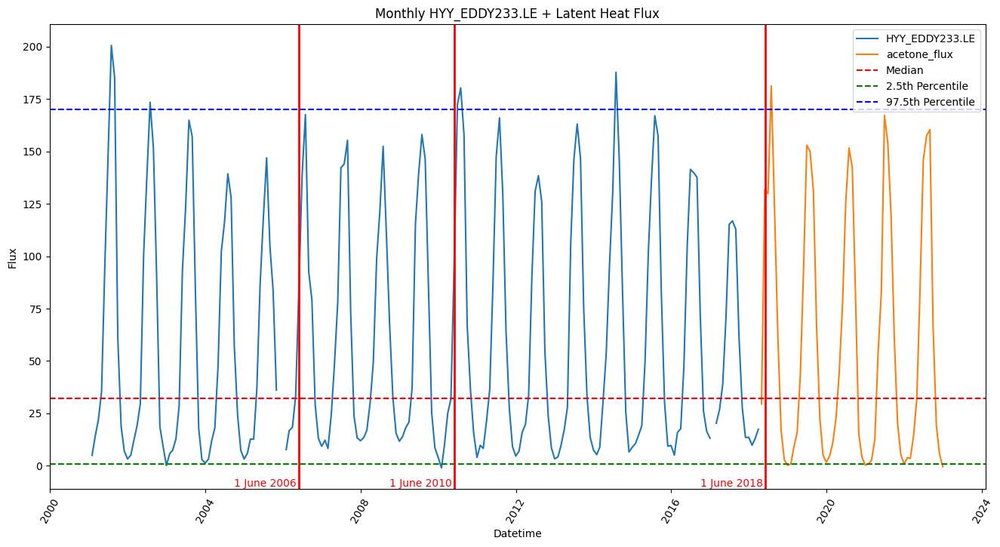

In [57]:
# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Calculate combined median and percentiles
combined_series = pd.concat([monthly_df4['HYY_EDDY233.LE'], monthly_df3['latent_heat_flux_after_4-2018']], axis=0)
median = combined_series.median()
q025 = combined_series.quantile(0.025)
q975 = combined_series.quantile(0.975)

# Plot the lines
ax.plot(monthly_df4['Datetime'], monthly_df4['HYY_EDDY233.LE'], label='HYY_EDDY233.LE')
ax.plot(monthly_df3['Datetime'], monthly_df3['latent_heat_flux_after_4-2018'], label='acetone_flux')
ax.axhline(y=median, color='r', linestyle='--', label='Median')
ax.axhline(y=q025, color='g', linestyle='--', label='2.5th Percentile')
ax.axhline(y=q975, color='b', linestyle='--', label='97.5th Percentile')

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Monthly HYY_EDDY233.LE + Latent Heat Flux')
ax.legend(loc='upper right')

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-50, 125)

# plt.tight_layout()
plt.show()

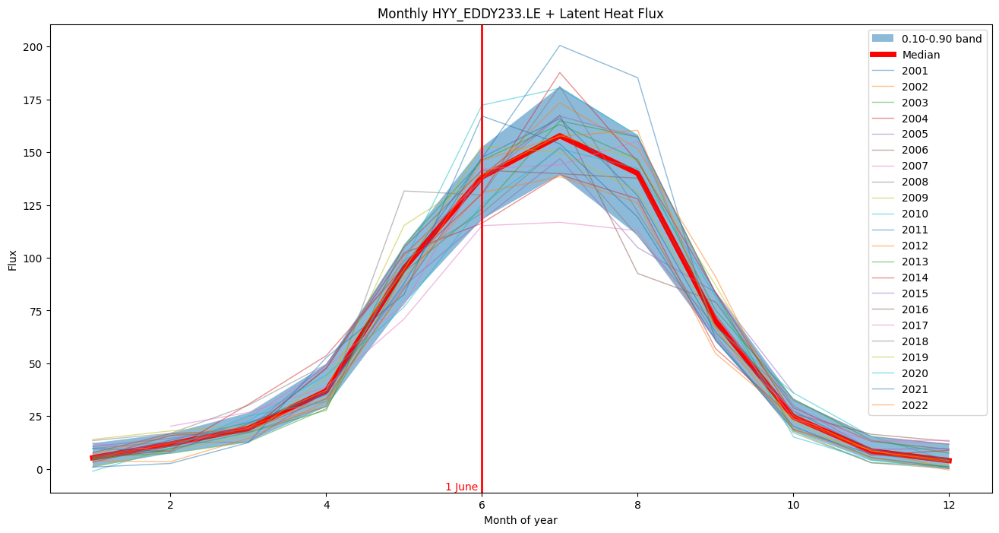

In [58]:
# Create a copy of the dataframe to avoid modifying the original
monthly_df3_years = monthly_df3.copy()
monthly_df4_years = monthly_df4.copy()

# Rename columns to 'flux'
monthly_df3_years = monthly_df3_years.rename(columns={'latent_heat_flux_after_4-2018': 'flux'})
monthly_df4_years = monthly_df4_years.rename(columns={'HYY_EDDY233.LE': 'flux'})

#Concatenate the dataframes
monthly_df34_years = pd.concat([monthly_df4_years[['Datetime', 'flux']],
                        monthly_df3_years[['Datetime', 'flux']]],
                       ignore_index=True)

# Add a column for the month of year
monthly_df34_years['month'] = monthly_df34_years['Datetime'].dt.month

# Add a column for the year
monthly_df34_years['year'] = monthly_df34_years['Datetime'].dt.year

# Drop the column 'Datetime'
monthly_df34_years = monthly_df34_years.drop(columns='Datetime')

# Aggregate duplicate rows by taking the mean of 'flux'
monthly_df34_years = monthly_df34_years.groupby(['month', 'year']).agg({'flux': 'mean'}).reset_index()

# Pivot the DataFrame so that rows are months and columns are years
monthly_df34_years = monthly_df34_years.pivot(index='month', columns='year', values='flux')

# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(monthly_df34_years.index, monthly_df34_years.quantile(0.1, axis=1), monthly_df34_years.quantile(0.9, axis=1), alpha=0.5)

# Plot the median
monthly_df34_years.median(axis=1).plot(ax=ax, color='r', linewidth=5)

# Plot the individual years
monthly_df34_years.plot(ax=ax, alpha=0.5, linewidth=1)

# Add labels, title, and legend
ax.set_xlabel('Month of year')
ax.set_ylabel('Flux')
ax.set_title('Monthly HYY_EDDY233.LE + Latent Heat Flux')
ax.legend(['0.10-0.90 band', 'Median'] + monthly_df34_years.columns.tolist(), loc='upper right')
# ax.legend(['Median'] + monthly_df34_years.columns.tolist(), loc='upper right')

# Highlight the period of interest
ax.axvline(6, color='r', lw=2)

# Add labels to the lines
ax.text(5.95, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# Set y-axis limits 
# ax.set_ylim(-30, 50)

# plt.tight_layout()
plt.show()


### Sensible heat flux

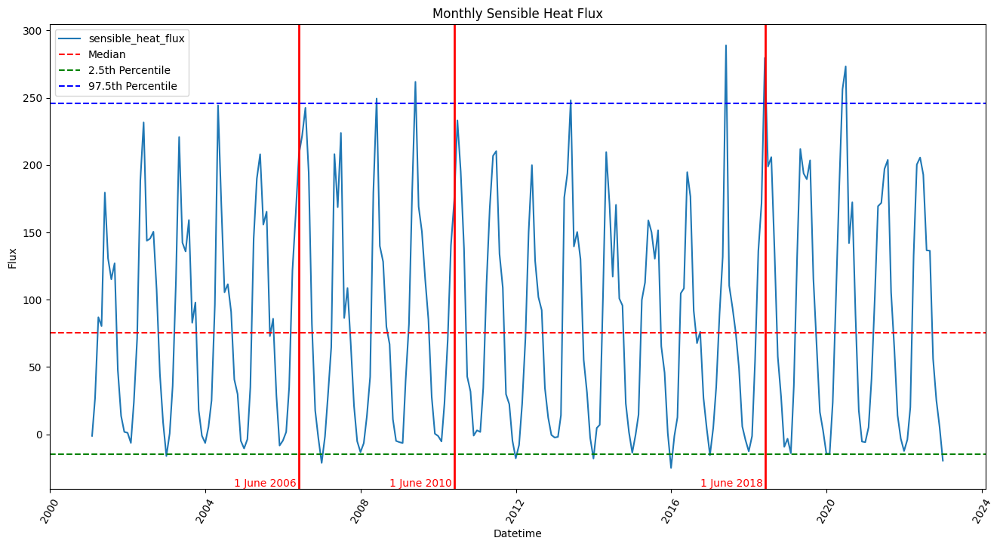

In [59]:
# Calculate median and the percentiles
median = monthly_df5['sensible_heat_flux'].median()
q025 = monthly_df5['sensible_heat_flux'].quantile(0.025)
q975 = monthly_df5['sensible_heat_flux'].quantile(0.975)

# Create the plot
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the lines
ax.plot(monthly_df5['Datetime'], monthly_df5['sensible_heat_flux'], label='sensible_heat_flux')
ax.axhline(y=median, color='r', linestyle='--', label='Median')
ax.axhline(y=q025, color='g', linestyle='--', label='2.5th Percentile')
ax.axhline(y=q975, color='b', linestyle='--', label='97.5th Percentile')

# Add labels, title, and legend
ax.set_xlabel('Datetime')
ax.set_ylabel('Flux')
ax.set_title('Monthly Sensible Heat Flux')
ax.legend()

# Grid and rotation for better readability
plt.xticks(rotation=60)

# Highlight the periods of interest
ax.axvline(datetime(2006,6,1), color='r', lw=2)
ax.axvline(datetime(2010,6,1), color='r', lw=2)
ax.axvline(datetime(2018,6,1), color='r', lw=2)

# Add labels to the lines
ax.text(datetime(2006, 5, 10), ax.get_ylim()[0], '1 June 2006', color='r', va='bottom', ha='right')
ax.text(datetime(2010, 5, 10), ax.get_ylim()[0], '1 June 2010', color='r', va='bottom', ha='right')
ax.text(datetime(2018, 5, 10), ax.get_ylim()[0], '1 June 2018', color='r', va='bottom', ha='right')

# plt.tight_layout()
plt.show()

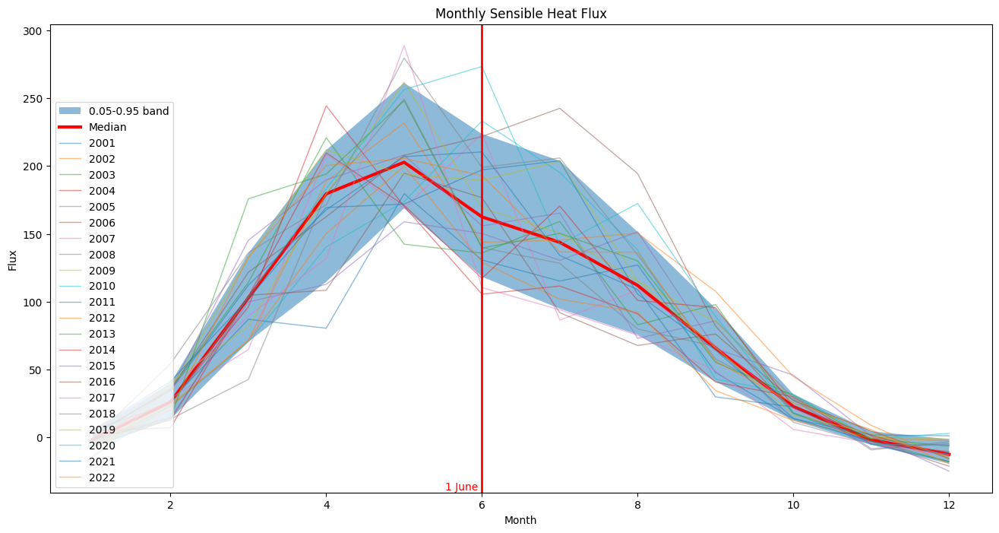

In [60]:
# Create a copy of the dataframe to avoid modifying the original
monthly_df5_years = monthly_df5.copy()

# Add a column for the week
monthly_df5_years['week'] = monthly_df5_years['Datetime'].dt.month

# Add a column for the year
monthly_df5_years['year'] = monthly_df5_years['Datetime'].dt.year

# Drop the column 'Datetime'
monthly_df5_years = monthly_df5_years.drop(columns='Datetime')

# Aggregate duplicate rows by taking the mean of 'flux'
monthly_df5_years = monthly_df5_years.groupby(['week', 'year']).agg({'sensible_heat_flux': 'mean'}).reset_index()

# Pivot the DataFrame so that rows are weeks and columns are years
monthly_df5_years = monthly_df5_years.pivot(index='week', columns='year', values='sensible_heat_flux')
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(monthly_df5_years.index, monthly_df5_years.quantile(0.1, axis=1), monthly_df5_years.quantile(0.9, axis=1), alpha=0.5)

# Plot the median
monthly_df5_years.median(axis=1).plot(ax=ax, color='r', linewidth=3)

# Plot the individiual years
monthly_df5_years.plot(ax=ax, alpha=0.5, linewidth=1)

# Add labels, title, and legend
ax.set_xlabel('Month')
ax.set_ylabel('Flux')
ax.set_title('Monthly Sensible Heat Flux')
# ax.legend(['Median'] + monthly_df5_years.columns.tolist(), loc='lower left')
ax.legend(['0.05-0.95 band', 'Median'] + monthly_df5_years.columns.tolist(), loc='lower left')

# Highlight the period of interest
ax.axvline(6, color='r', lw=2)

# Add labels to the lines
ax.text(5.95, ax.get_ylim()[0], '1 June', color='r', va='bottom', ha='right')

# plt.tight_layout()
plt.show()


## X-day Rolling Medians

### Note! The rolling medians are calculated from the median "Daily data"

In [61]:
# set the window size
WINDOW_SIZE = 30

# Dictionary to help selecting data and labeling the plots
months = {1: 'January', 
          2: 'February', 
          3: 'March', 
          4: 'April', 
          5: 'May', 
          6: 'June', 
          7: 'July', 
          8: 'August', 
          9: 'September', 
          10: 'October', 
          11: 'November', 
          12: 'December'}

# select the months of interest
start_month = 5
end_month = 8

### NEE flux

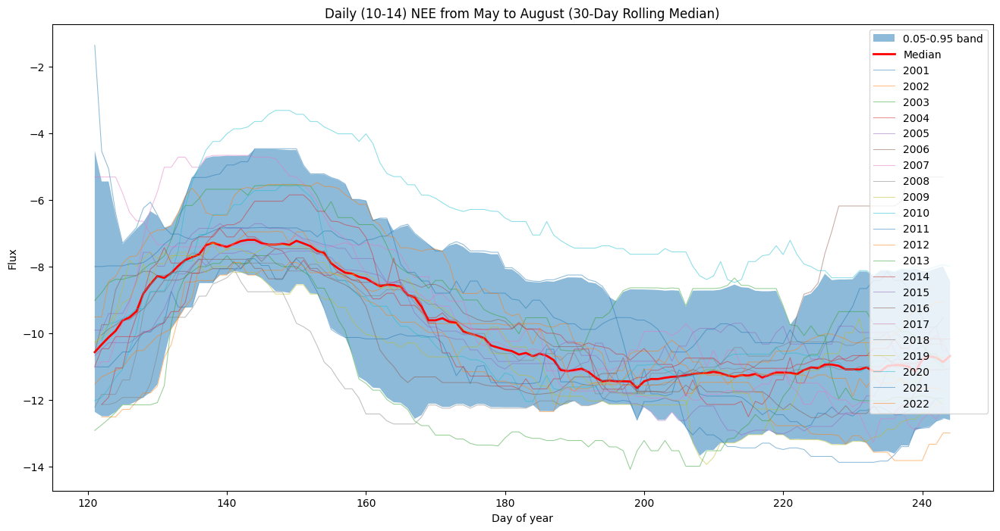

In [62]:
# Filter data from start_month to end_month
daily_df1_years = daily_df1[(daily_df1['Datetime'].dt.month >= start_month) 
                            & (daily_df1['Datetime'].dt.month <= end_month)].copy()

# Calculate WIDOW_SIZE-day rolling median
daily_df1_years['rolling_median'] = daily_df1_years['NEE'].rolling(window=WINDOW_SIZE, min_periods=1).median()

# Add a column for the day of year
daily_df1_years['day'] = daily_df1_years['Datetime'].dt.dayofyear

# Add a column for the year
daily_df1_years['year'] = daily_df1_years['Datetime'].dt.year

# Drop the column 'Datetime'
daily_df1_years = daily_df1_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are days and columns are years
daily_df1_years = daily_df1_years.pivot(index='day', columns='year', values='rolling_median')

fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(daily_df1_years.index, daily_df1_years.quantile(0.05, axis=1), daily_df1_years.quantile(0.95, axis=1), alpha=0.5)

# Plot the median
daily_df1_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individual years
daily_df1_years.plot(ax=ax, alpha=0.5, linewidth=0.75)

# Add labels, title, and legend
ax.set_xlabel('Day of year')
ax.set_ylabel('Flux')
ax.set_title(f'Daily (10-14) NEE from {months[start_month]} to {months[end_month]} ({WINDOW_SIZE}-Day Rolling Median)')
ax.legend(['0.05-0.95 band', 'Median'] + daily_df1_years.columns.tolist(), loc='upper right')

# Set y-axis limits
#ax.set_ylim(-100, 1000)

# Show plot
plt.show()

### VOC

#### Monoterpene

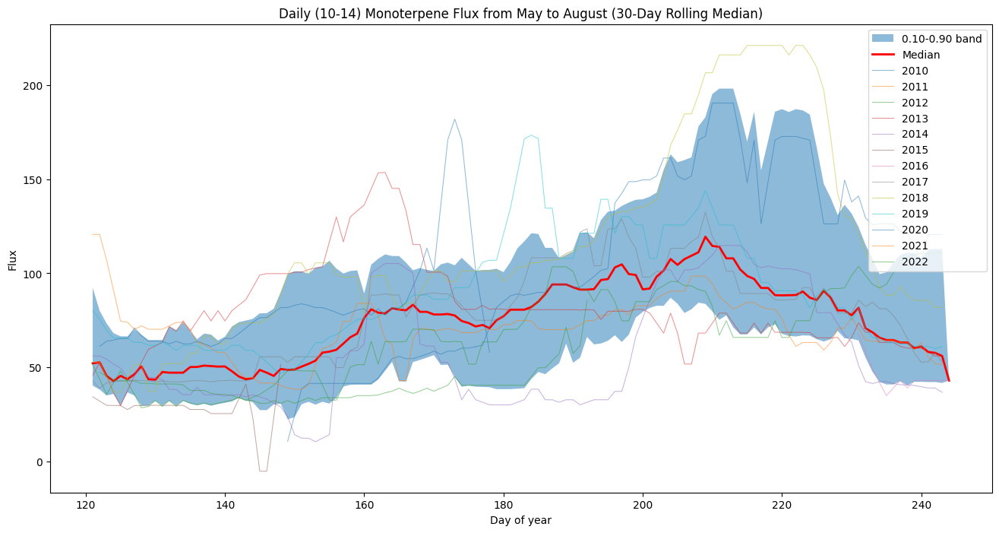

In [63]:
# Filter data for start_month and end_month
daily_df5_years = daily_df2[(daily_df2['Datetime'].dt.month >= start_month) 
                            & (daily_df2['Datetime'].dt.month <= end_month)].copy()

# Calculate WINDOW_SIZE-day rolling median
daily_df5_years['rolling_median'] = daily_df5_years['monoterpene_flux'].rolling(window=WINDOW_SIZE, min_periods=1).median()

# Add a column for the day of year
daily_df5_years['day'] = daily_df5_years['Datetime'].dt.dayofyear

# Add a column for the year
daily_df5_years['year'] = daily_df5_years['Datetime'].dt.year

# Drop the column 'Datetime'
daily_df5_years = daily_df5_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are days and columns are years
daily_df5_years = daily_df5_years.pivot(index='day', columns='year', values='rolling_median')

fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(daily_df5_years.index, daily_df5_years.quantile(0.10, axis=1), daily_df5_years.quantile(0.90, axis=1), alpha=0.5)

# Plot the median
daily_df5_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individual years
daily_df5_years.plot(ax=ax, alpha=0.5, linewidth=0.75)

# Add labels, title, and legend
ax.set_xlabel('Day of year')
ax.set_ylabel('Flux')
ax.set_title(f'Daily (10-14) Monoterpene Flux from {months[start_month]} to {months[end_month]} ({WINDOW_SIZE}-Day Rolling Median)')
ax.legend(['0.10-0.90 band', 'Median'] + daily_df5_years.columns.tolist(), loc='upper right')

# Set y-axis limits
#ax.set_ylim(-100, 1000)

# Show plot
plt.show()

#### Methanol

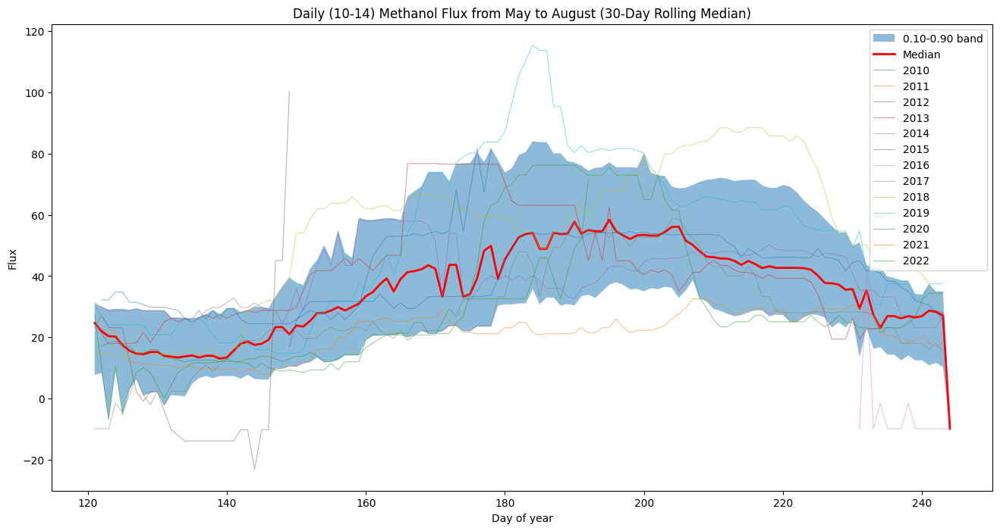

In [64]:
# Filter data for start_month to end_month
daily_df5_years = daily_df2[(daily_df2['Datetime'].dt.month >= start_month) 
                            & (daily_df2['Datetime'].dt.month <= end_month)].copy()

# Calculate WINDOW_SIZE-day rolling median
daily_df5_years['rolling_median'] = daily_df5_years['methanol_flux'].rolling(window=WINDOW_SIZE, min_periods=1).median()

# Add a column for the day of year
daily_df5_years['day'] = daily_df5_years['Datetime'].dt.dayofyear

# Add a column for the year
daily_df5_years['year'] = daily_df5_years['Datetime'].dt.year

# Drop the column 'Datetime'
daily_df5_years = daily_df5_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are days and columns are years
daily_df5_years = daily_df5_years.pivot(index='day', columns='year', values='rolling_median')

fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(daily_df5_years.index, daily_df5_years.quantile(0.10, axis=1), daily_df5_years.quantile(0.90, axis=1), alpha=0.5)

# Plot the median
daily_df5_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individual years
daily_df5_years.plot(ax=ax, alpha=0.5, linewidth=0.75)

# Add labels, title, and legend
ax.set_xlabel('Day of year')
ax.set_ylabel('Flux')
ax.set_title(f'Daily (10-14) Methanol Flux from {months[start_month]} to {months[end_month]} ({WINDOW_SIZE}-Day Rolling Median)')
ax.legend(['0.10-0.90 band', 'Median'] + daily_df5_years.columns.tolist(), loc='upper right')

# Set y-axis limits
#ax.set_ylim(-100, 1000)

# Show plot
plt.show()

#### Acetone

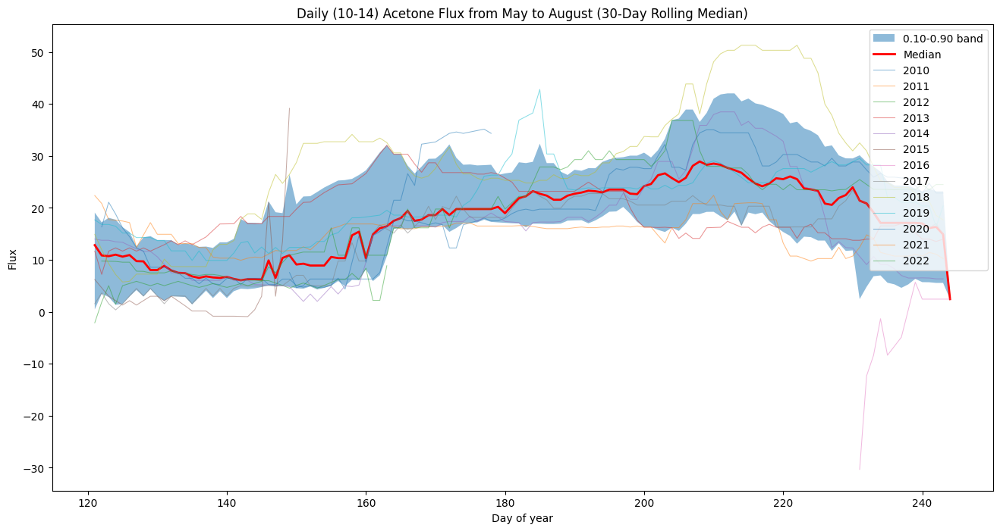

In [65]:
# Filter data for start_month to end_month
daily_df5_years = daily_df2[(daily_df2['Datetime'].dt.month >= start_month) 
                            & (daily_df2['Datetime'].dt.month <= end_month)].copy()

# Calculate WINDOW_SIZE-day rolling median
daily_df5_years['rolling_median'] = daily_df5_years['acetone_flux'].rolling(window=WINDOW_SIZE, min_periods=1).median()

# Add a column for the day of year
daily_df5_years['day'] = daily_df5_years['Datetime'].dt.dayofyear

# Add a column for the year
daily_df5_years['year'] = daily_df5_years['Datetime'].dt.year

# Drop the column 'Datetime'
daily_df5_years = daily_df5_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are days and columns are years
daily_df5_years = daily_df5_years.pivot(index='day', columns='year', values='rolling_median')

fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(daily_df5_years.index, daily_df5_years.quantile(0.10, axis=1), daily_df5_years.quantile(0.90, axis=1), alpha=0.5)

# Plot the median
daily_df5_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individual years
daily_df5_years.plot(ax=ax, alpha=0.5, linewidth=0.75)

# Add labels, title, and legend
ax.set_xlabel('Day of year')
ax.set_ylabel('Flux')
ax.set_title(f'Daily (10-14) Acetone Flux from {months[start_month]} to {months[end_month]} ({WINDOW_SIZE}-Day Rolling Median)')
ax.legend(['0.10-0.90 band', 'Median'] + daily_df5_years.columns.tolist(), loc='upper right')

# Set y-axis limits
#ax.set_ylim(-100, 1000)

# Show plot
plt.show()

#### Acetaldehyde

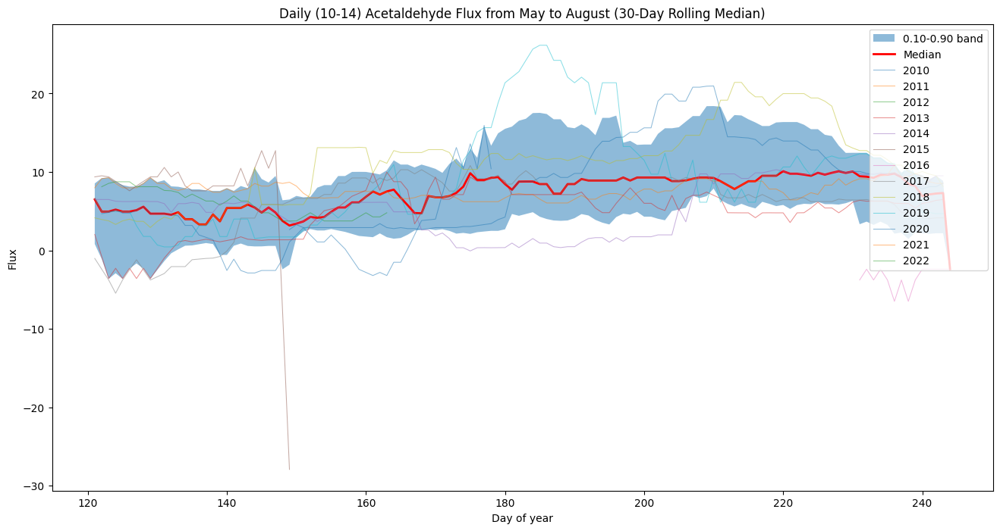

In [66]:
# Filter data from start_month to end_month
daily_df5_years = daily_df2[(daily_df2['Datetime'].dt.month >= start_month) 
                            & (daily_df2['Datetime'].dt.month <= end_month)].copy()

# Calculate WIDOW_SIZE-day rolling median
daily_df5_years['rolling_median'] = daily_df5_years['acetaldehyde_flux'].rolling(window=WINDOW_SIZE, min_periods=1).median()

# Add a column for the day of year
daily_df5_years['day'] = daily_df5_years['Datetime'].dt.dayofyear

# Add a column for the year
daily_df5_years['year'] = daily_df5_years['Datetime'].dt.year

# Drop the column 'Datetime'
daily_df5_years = daily_df5_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are days and columns are years
daily_df5_years = daily_df5_years.pivot(index='day', columns='year', values='rolling_median')

fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(daily_df5_years.index, daily_df5_years.quantile(0.10, axis=1), daily_df5_years.quantile(0.90, axis=1), alpha=0.5)

# Plot the median
daily_df5_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individual years
daily_df5_years.plot(ax=ax, alpha=0.5, linewidth=0.75)

# Add labels, title, and legend
ax.set_xlabel('Day of year')
ax.set_ylabel('Flux')
ax.set_title(f'Daily (10-14) Acetaldehyde Flux from {months[start_month]} to {months[end_month]} ({WINDOW_SIZE}-Day Rolling Median)')
ax.legend(['0.10-0.90 band', 'Median'] + daily_df5_years.columns.tolist(), loc='upper right')

# Set y-axis limits
#ax.set_ylim(-100, 1000)

# Show plot
plt.show()

### Latent heat flux

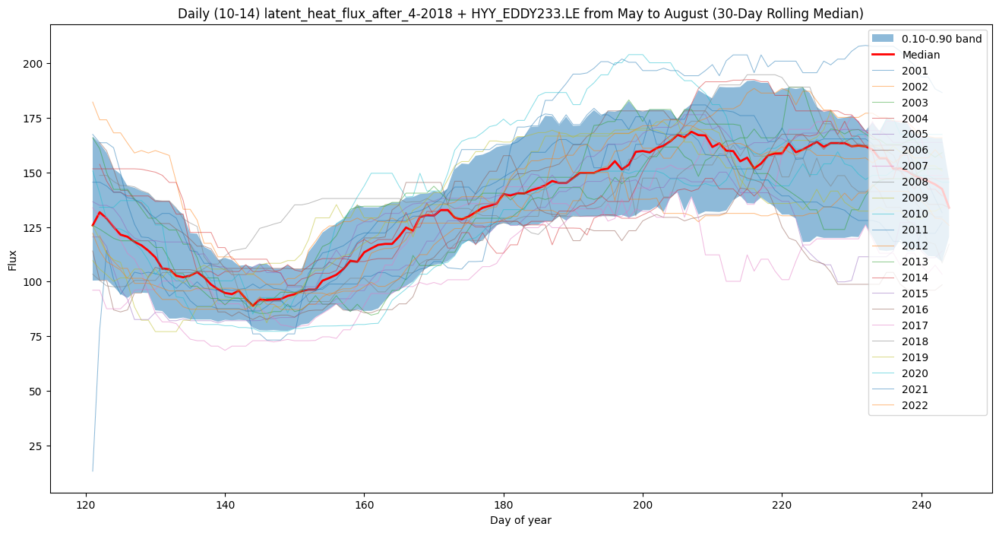

In [67]:
# Filter data from start_month to end_month
daily_df3_years = daily_df3[(daily_df3['Datetime'].dt.month >= start_month) 
                            & (daily_df3['Datetime'].dt.month <= end_month)].copy()
daily_df4_years = daily_df4[(daily_df4['Datetime'].dt.month >= start_month) 
                            & (daily_df4['Datetime'].dt.month <= end_month)].copy()

# Rename columns to 'flux'
daily_df3_years = daily_df3_years.rename(columns={'latent_heat_flux_after_4-2018': 'flux'})
daily_df4_years = daily_df4_years.rename(columns={'HYY_EDDY233.LE': 'flux'})

#Concatenate the dataframes
daily_df34_years = pd.concat([daily_df4_years[['Datetime', 'flux']],
                        daily_df3_years[['Datetime', 'flux']]],
                       ignore_index=True)

# Calculate WINDOW_SIZE-day rolling median
daily_df34_years['rolling_median'] = daily_df34_years['flux'].rolling(window=WINDOW_SIZE, min_periods=1).median()

# Add a column for the day of year
daily_df34_years['day'] = daily_df34_years['Datetime'].dt.dayofyear

# Add a column for the year
daily_df34_years['year'] = daily_df34_years['Datetime'].dt.year

# Drop the column 'Datetime'
daily_df34_years = daily_df34_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are days and columns are years
daily_df34_years = daily_df34_years.pivot(index='day', columns='year', values='rolling_median')

fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(daily_df34_years.index, daily_df34_years.quantile(0.10, axis=1), daily_df34_years.quantile(0.90, axis=1), alpha=0.5)

# Plot the median
daily_df34_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individual years
daily_df34_years.plot(ax=ax, alpha=0.5, linewidth=0.75)

# Add labels, title, and legend
ax.set_xlabel('Day of year')
ax.set_ylabel('Flux')
ax.set_title(f'Daily (10-14) latent_heat_flux_after_4-2018 + HYY_EDDY233.LE from {months[start_month]} to {months[end_month]} ({WINDOW_SIZE}-Day Rolling Median)')
ax.legend(['0.10-0.90 band', 'Median'] + daily_df34_years.columns.tolist(), loc='upper right')

# Set y-axis limits
#ax.set_ylim(-100, 1000)

# Show plot
plt.show()

### Sensible Heat Flux

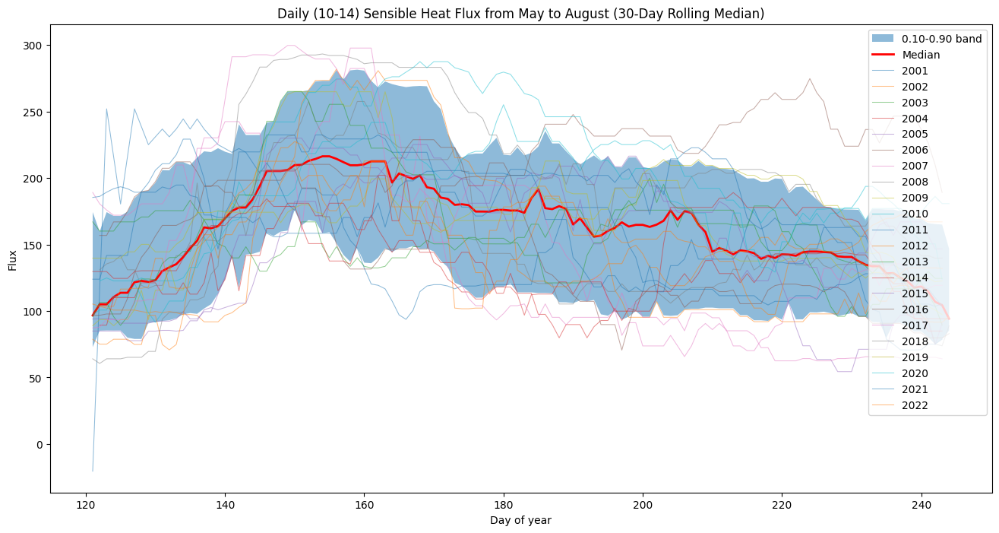

In [68]:
# Filter data from start_month to end_month
daily_df5_years = daily_df5[(daily_df5['Datetime'].dt.month >= start_month) 
                            & (daily_df5['Datetime'].dt.month <= end_month)].copy()

# Calculate WIDOW_SIZE-day rolling median
daily_df5_years['rolling_median'] = daily_df5_years['sensible_heat_flux'].rolling(window=WINDOW_SIZE, min_periods=1).median()

# Add a column for the day of year
daily_df5_years['day'] = daily_df5_years['Datetime'].dt.dayofyear

# Add a column for the year
daily_df5_years['year'] = daily_df5_years['Datetime'].dt.year

# Drop the column 'Datetime'
daily_df5_years = daily_df5_years.drop(columns='Datetime')

# Pivot the DataFrame so that rows are days and columns are years
daily_df5_years = daily_df5_years.pivot(index='day', columns='year', values='rolling_median')

fig, ax = plt.subplots(figsize=(16, 8))

# Plot the percentile band
ax.fill_between(daily_df5_years.index, daily_df5_years.quantile(0.10, axis=1), daily_df5_years.quantile(0.90, axis=1), alpha=0.5)

# Plot the median
daily_df5_years.median(axis=1).plot(ax=ax, color='r', linewidth=2)

# Plot the individual years
daily_df5_years.plot(ax=ax, alpha=0.5, linewidth=0.75)

# Add labels, title, and legend
ax.set_xlabel('Day of year')
ax.set_ylabel('Flux')
ax.set_title(f'Daily (10-14) Sensible Heat Flux from {months[start_month]} to {months[end_month]} ({WINDOW_SIZE}-Day Rolling Median)')
ax.legend(['0.10-0.90 band', 'Median'] + daily_df5_years.columns.tolist(), loc='upper right')

# Set y-axis limits
#ax.set_ylim(-100, 1000)

# Show plot
plt.show()